# Исследование объявлений о продаже квартир

В вашем распоряжении данные сервиса Яндекс.Недвижимость — архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. 

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма. 


Передо мной стоит задача провести исследовательский анализ данных и изучить такие параметры, как:


    - Площадь, цена, число комнат, высота потолков;
    - Время продажи квартиры и узнать, сколько обычно длится сделка;
    - Редкие и выбивающиеся зьначения и убрать их;
    - Факторы, влияющие больше всего на стоимость квартиры;
    - 10 населённых пунктов с наибольшим числом объявлений ;
    - Зависимость стоимости и удаленности от центра, найти центральную зону и изучить параметры(площадь, цена, число комнат, высота потолков) среди них


Изученные параметры нам пригодятся для того, чтобы отследить мошенническую деятельность и выявлять аномалии в данных.


### Шаг 1. Изучение общей информации. 

In [1]:
import pandas as pd

In [2]:
import pandas_profiling

In [3]:
from pandas_profiling import ProfileReport

In [4]:
import matplotlib.pyplot as plt

In [5]:
import numpy as np

In [6]:
import scipy.stats as stats

In [7]:
import plotly.express as px

In [8]:
import seaborn as sns

In [9]:
data_apartment = pd.read_csv('/Users/valeriyaniskorodova/Y.Praktikum/Sprint 2/real_estate_data.csv', sep='\t')

In [10]:
data_apartment

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.00,2019-03-07T00:00:00,3,2.70,16.0,51.0,8,NaN,...,25.00,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.40,2018-12-04T00:00:00,1,NaN,11.0,18.6,1,NaN,...,11.00,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.00,2015-08-20T00:00:00,2,NaN,5.0,34.3,4,NaN,...,8.30,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.00,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.00,2018-06-19T00:00:00,2,3.03,14.0,32.0,13,NaN,...,41.00,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23694,9,9700000.0,133.81,2017-03-21T00:00:00,3,3.70,5.0,73.3,3,NaN,...,13.83,NaN,Санкт-Петербург,24665.0,4232.0,1.0,796.0,3.0,381.0,NaN
23695,14,3100000.0,59.00,2018-01-15T00:00:00,3,NaN,5.0,38.0,4,NaN,...,8.50,NaN,Тосно,NaN,NaN,NaN,NaN,NaN,NaN,45.0
23696,18,2500000.0,56.70,2018-02-11T00:00:00,2,NaN,3.0,29.7,1,NaN,...,NaN,NaN,село Рождествено,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23697,13,11475000.0,76.75,2017-03-28T00:00:00,2,3.00,17.0,NaN,12,NaN,...,23.30,2.0,Санкт-Петербург,39140.0,10364.0,2.0,173.0,3.0,196.0,602.0


In [11]:
data_apartment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

В таблице всего 22 столбца и 23699 строк

Первое, что бросается в глаза - пропущенные значения. В этой таблице их много, находятся они в разных стобцах. Посмотрим более детальный анализ таблицы.

Также заметим, что тип даных у многих столбцов float. Не везде нам удобно будет использовать этот тип данных, дальше рассмотрим, в каких столбцах мы будем заменять на другой тип данных и почему

In [12]:
pandas_profiling.ProfileReport(data_apartment)

Из данного отчета, а так же из метода info() сразу видно в каких столбцах пропущены значения, а именно ceiling_height, floors_total, living_area, is_apartment, kitchen_area, balcony, locality_name,airports_nearest, cityCenters_nearest, parks_around3000, parks_nearest, ponds_around3000, ponds_nearest, days_exposition

В столбцах total_images и balcony присутствуют нули. Эти столбцы дают информацию о количестве балконов в квартире и фотографий квартиры в объявлении. Так как квартиры бывают без балкона, а также в объявлении может и не быть фотографий, то эти нули не являются пропусками, а несут за собой важную информацию.

В столбце first_day_exposition видим, что дата и время записаны в строку.

Наблюдается корреляция между данными, например living_area и total_area. Между некоторыми столбцами существует недействительный коэффициент(kitchen_area и studio, kitchen_area и open_plan).

В столбце ceiling_height видим аномальные значения, 100 метров. Не существует таких высоких потолков. В среднем высота потолков около 3 метров. Бывает и больше, но точно не 100 метров.

В столбце living_area видим выделяющееся максимальное значение - 409.7 кв. м. Если эти данные в одной строке с данными из столбца rooms, в котором количество комнат будет 12 и больше, то такая большая цифра не будет считаться аномальной.

In [13]:
data_apartment.columns

Index(['total_images', 'last_price', 'total_area', 'first_day_exposition',
       'rooms', 'ceiling_height', 'floors_total', 'living_area', 'floor',
       'is_apartment', 'studio', 'open_plan', 'kitchen_area', 'balcony',
       'locality_name', 'airports_nearest', 'cityCenters_nearest',
       'parks_around3000', 'parks_nearest', 'ponds_around3000',
       'ponds_nearest', 'days_exposition'],
      dtype='object')

Убедились, что лишних пробелов в столбцах нет. Названия можно оставить прежними. 

### Вывод

Обобщим проведенный анализ таблицы и выделим основные пункты, которые нужно проработать в предобработке данных:
- Пропущенные значения;
- Не корректный тип данных;
- Высокая корреляция между некоторыми данными;
- Аномальные значения;

### Шаг 2. Предобработка данных

In [14]:
data_apartment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

В столбце first_day_exposition переведем строки в даты, для удобной работы с этими данными.

In [15]:
data_apartment['first_day_exposition'] = pd.to_datetime(data_apartment['first_day_exposition'], format = '%Y-%m-%dT%H:%M:%S')

In [16]:
data_apartment.head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.00,2019-03-07,3,2.70,16.0,51.00,8,NaN,...,25.00,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.40,2018-12-04,1,NaN,11.0,18.60,1,NaN,...,11.00,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.00,2015-08-20,2,NaN,5.0,34.30,4,NaN,...,8.30,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.00,2015-07-24,3,NaN,14.0,NaN,9,NaN,...,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.00,2018-06-19,2,3.03,14.0,32.00,13,NaN,...,41.00,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0
5,10,2890000.0,30.40,2018-09-10,1,NaN,12.0,14.40,5,NaN,...,9.10,NaN,городской посёлок Янино-1,NaN,NaN,NaN,NaN,NaN,NaN,55.0
6,6,3700000.0,37.30,2017-11-02,1,NaN,26.0,10.60,6,NaN,...,14.40,1.0,посёлок Парголово,52996.0,19143.0,0.0,NaN,0.0,NaN,155.0
7,5,7915000.0,71.60,2019-04-18,2,NaN,24.0,NaN,22,NaN,...,18.90,2.0,Санкт-Петербург,23982.0,11634.0,0.0,NaN,0.0,NaN,NaN
8,20,2900000.0,33.16,2018-05-23,1,NaN,27.0,15.43,26,NaN,...,8.81,NaN,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,189.0
9,18,5400000.0,61.00,2017-02-26,3,2.50,9.0,43.60,7,NaN,...,6.50,2.0,Санкт-Петербург,50898.0,15008.0,0.0,NaN,0.0,NaN,289.0


Сразу заменим тип данных в столбце is_apartment. В описании к таблице у нас заявлен булевый тип данных, но сейчас тип данных object, это помещает дальнейшему анализу данных.

In [17]:
data_apartment['is_apartment'] = data_apartment['is_apartment'].astype('bool')

In [18]:
data_apartment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23699 non-null  int64         
 1   last_price            23699 non-null  float64       
 2   total_area            23699 non-null  float64       
 3   first_day_exposition  23699 non-null  datetime64[ns]
 4   rooms                 23699 non-null  int64         
 5   ceiling_height        14504 non-null  float64       
 6   floors_total          23613 non-null  float64       
 7   living_area           21796 non-null  float64       
 8   floor                 23699 non-null  int64         
 9   is_apartment          23699 non-null  bool          
 10  studio                23699 non-null  bool          
 11  open_plan             23699 non-null  bool          
 12  kitchen_area          21421 non-null  float64       
 13  balcony         

Видим, что у столбца first_day_exposition изменился тип данных на datetime64. Теперь нам будет удобнее работать с этим столбцом.

Также у столбца is_apartment изменился тип данных на bool, мы видим, что сразу исчезли пропущенные значения, благодар тому, что мы поменяли тип данных на корректный.

Посмотрим еще раз в каких столбцах пропущены значения

In [19]:
data_apartment.isnull().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment                0
studio                      0
open_plan                   0
kitchen_area             2278
balcony                 11519
locality_name              49
airports_nearest         5542
cityCenters_nearest      5519
parks_around3000         5518
parks_nearest           15620
ponds_around3000         5518
ponds_nearest           14589
days_exposition          3181
dtype: int64

Пропуски в столбце ceiling_height возникли из-за того, что не все знают высоту потолков в своей квартире, более того, как мне кажется, на сайте такая информация не обязательная для заполнения и некоторые владельцы квартир просто не заморачиваются об этом, раз можно эту информацию не указывать. Так как данный столбец не зависит никак от других, то можем считать его механизм формирования пропусков MCAR, то есть пропуски совершенно случайные. Тоже самое можно сказать про столбец, где содержится информация о количестве этажей, пропусков там очень мало, но формирование их скорее тоже случайное.


Формирование пропусков в столбце living_area скорее MAR, так как этот столбец имеет зависимость со столбцом total_area и у нас есть значения в этом столбце, то пропуски в этом столбце могут быть случайными.


В столбце kitchen_area формирование пропусков MAR, так как площадь кухни зависит общей площади, так и от количества комнат. Появление пропусков в данном столбце может быть обусловленно тем, что данные квартиры свободной планировки, например.
                          

В столбце balcony пропущененные значения означают отсутсвие балконов.


В таких столбцах, как airports_nearest, cityCenters_nearest, parks_around3000, parks_nearest, ponds_around3000, ponds_nearest значения заполняются автоматически на основе картографических данных. Появление их в данных можно объяснить тем, что было невозможным определить расположение города, либо же невозмодностью найти ближайщие парки, пруды, аэропорт, так как может быть эти данные определялись по определенному диапозону значений в расстоянии.


Взглянем на таблицу корреляции, чтобы понять существует ли взаимосвязь между столбцами с пропущенными значениями.

In [20]:
data_apartment.corr()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
total_images,1.000000,0.104473,0.115352,0.099288,-0.001987,0.010427,0.104780,0.031340,0.039860,-0.029303,-0.024407,0.104756,0.121693,-0.002298,-0.047666,0.021120,-0.008347,-0.011553,-0.003034,-0.026657
last_price,0.104473,1.000000,0.653675,0.363343,0.085430,-0.006984,0.566492,0.026576,0.000640,-0.025362,-0.008802,0.519869,0.029646,-0.026239,-0.206747,0.151058,-0.016414,0.159996,-0.084809,0.081146
total_area,0.115352,0.653675,1.000000,0.758344,0.095490,-0.075774,0.939537,-0.024754,-0.007836,-0.072653,-0.034885,0.609121,0.047937,-0.030753,-0.231446,0.164689,-0.021497,0.162346,-0.097969,0.149675
rooms,0.099288,0.363343,0.758344,1.000000,0.054457,-0.228215,0.845977,-0.150862,-0.005338,-0.147286,-0.087500,0.269945,0.017991,-0.061199,-0.184864,0.137257,-0.054549,0.092693,-0.057689,0.126961
ceiling_height,-0.001987,0.085430,0.095490,0.054457,1.000000,-0.028732,0.090650,-0.011798,-0.030715,0.001674,0.042777,0.087641,0.040523,-0.023947,-0.091689,0.065915,-0.019167,0.078209,-0.059090,0.019091
floors_total,0.010427,-0.006984,-0.075774,-0.228215,-0.028732,1.000000,-0.169311,0.678059,-0.003472,0.070151,0.050791,0.163944,0.194065,0.108288,0.019774,-0.252833,0.097527,-0.122735,0.038864,-0.052234
living_area,0.104780,0.566492,0.939537,0.845977,0.090650,-0.169311,1.000000,-0.097210,-0.009535,-0.056231,-0.033711,0.428674,0.018849,-0.057912,-0.231368,0.184453,-0.050167,0.148933,-0.081674,0.142454
floor,0.031340,0.026576,-0.024754,-0.150862,-0.011798,0.678059,-0.097210,1.000000,-0.006182,0.036940,0.035824,0.135531,0.168773,0.071597,0.009084,-0.163784,0.073045,-0.076312,0.024850,-0.039463
is_apartment,0.039860,0.000640,-0.007836,-0.005338,-0.030715,-0.003472,-0.009535,-0.006182,1.000000,0.003569,0.001754,-0.011218,-0.025552,0.007712,-0.000720,-0.001200,-0.018743,-0.009599,0.019909,-0.063304
studio,-0.029303,-0.025362,-0.072653,-0.147286,0.001674,0.070151,-0.056231,0.036940,0.003569,1.000000,-0.004235,NaN,0.031455,-0.021876,-0.007029,-0.030202,0.009134,0.000939,0.002606,-0.022476


Столбец **ceiling_height** имеет очень низкий коэффициент с другими столбцами, что говорит о том, что взаимосвязи с ними нет.

Эти пропущенные значения занимают почти 39% от всех значений. Удалять такие данные мы не можем, так как потеряем важные значения в этих строках. 

Посмотрим, от чего зависит высота потолка. Высоту потолка регламентирует п.5.8 СНиП 31-01-2003. Согласно этому документу, высота потолка зависит от климатических условий в конкретном районе, а также от назначения и типа комнаты. В теплых зонах потолок должен располагаться на высоте не менее 2,7 метра, а для остальных районов минимальная высота потолка составляет 2,5 метра

Но в Санкт-Петербурге высота потолка может отличаться еще и от времени постройки здания. Думаю, что лучше будет заменить средним значением по количеству этажей в доме.


Для того, чтобы облегчить дальнейшую предобработку данных, проверим уникальные значения в стобце locality_name и избавимся от пропущенных значений

**locality_name** имеет всего 49 пропущенных значений, это меньше 1% от всех значений в таблице. Мы можем удалить эти значения, они не сильно повлияют на дальнейшие исследования.

In [21]:
data_apartment.dropna(subset = ['locality_name'], inplace = True)

In [22]:
data_apartment.reset_index(drop=True,inplace=True)

In [23]:
data_apartment['locality_name'].isnull().sum()

0

Обработаем сразу столбец locality_name. Посмотрим какие уникальные значения существуют в нем.

In [24]:
data_apartment['locality_name'].unique()

array(['Санкт-Петербург', 'посёлок Шушары', 'городской посёлок Янино-1',
       'посёлок Парголово', 'посёлок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина', 'поселок Мурино',
       'деревня Фёдоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'посёлок Металлострой',
       'посёлок городского типа Лебяжье',
       'посёлок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'посёлок Аннино',
       'поселок городского типа Ефимовский', 'посёлок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'посёлок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', '

Видим, что в некоторых случаях используется буква ё, а в других е. Заменим все на букву е

In [25]:
data_apartment['locality_name'] = data_apartment['locality_name'].str.replace('ё', 'е')

In [26]:
data_apartment['locality_name'].unique()

array(['Санкт-Петербург', 'поселок Шушары', 'городской поселок Янино-1',
       'поселок Парголово', 'поселок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина',
       'деревня Федоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'поселок Металлострой',
       'поселок городского типа Лебяжье',
       'поселок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'поселок Аннино',
       'поселок городского типа Ефимовский', 'поселок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'поселок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', 'поселок Новый Свет

Далее, для удобства, избавимся от типов поселений, таких как поселок, поселок городского типа и тд

In [27]:
data_apartment['locality_name'] = data_apartment['locality_name'].str.replace('деревня |поселок |коттеджный |садовое |садоводческое |товарищество |некоммерческое |городской |городского типа |станции |село |при железнодорожной станции |городского типа |имени ', '', regex=True)

In [28]:
data_apartment['locality_name'].unique()

array(['Санкт-Петербург', 'Шушары', 'Янино-1', 'Парголово', 'Мурино',
       'Ломоносов', 'Сертолово', 'Петергоф', 'Пушкин', 'Кудрово',
       'Коммунар', 'Колпино', 'Красный Бор', 'Гатчина', 'Федоровское',
       'Выборг', 'Кронштадт', 'Кировск', 'Новое Девяткино',
       'Металлострой', 'Лебяжье', 'Сиверский', 'Молодцово',
       'Кузьмоловский', 'Новая Ропша', 'Павловск', 'Пикколово',
       'Всеволожск', 'Волхов', 'Кингисепп', 'Приозерск', 'Сестрорецк',
       'Куттузи', 'Аннино', 'Ефимовский', 'Плодовое', 'Заклинье',
       'Торковичи', 'Первомайское', 'Красное Село', 'Понтонный',
       'Сясьстрой', 'Старая', 'Лесколово', 'Новый Свет', 'Сланцы',
       'Путилово', 'Ивангород', 'Шлиссельбург', 'Никольское',
       'Зеленогорск', 'Сосновый Бор', 'Оржицы', 'Кальтино', 'Романовка',
       'Бугры', 'Рощино', 'Кириши', 'Луга', 'Волосово', 'Отрадное',
       'Павлово', 'Оредеж', 'Копорье', 'Молодежное', 'Тихвин', 'Победа',
       'Нурма', 'Синявино', 'Тосно', 'Стрельна', 'Бокситогорск',


Заменю пропущенные значения в столбце ceiling_height на медианное значение по этажности дома.


In [29]:
ceiling_median = data_apartment.pivot_table(index='floors_total', values='ceiling_height', aggfunc=['median', 'count'])
ceiling_median.columns=['median', 'count']
ceiling_median.head(10)

,median,count
floors_total,,
1.0,2.80,10
2.0,2.70,213
3.0,2.80,399
4.0,3.00,787
5.0,2.55,3662
6.0,3.00,618
7.0,3.00,397
8.0,2.80,219
9.0,2.55,2557


In [30]:
data_apartment['ceiling_height'] = data_apartment['ceiling_height'].fillna(data_apartment.groupby('floors_total')['ceiling_height'].transform('median'))

In [31]:
data_apartment['ceiling_height'].isnull().sum()

77

In [32]:
data_apartment['ceiling_height'].median()

2.65


Оставщиеся значения заменим на среднее значение по столбцу


In [33]:
data_apartment['ceiling_height'] = data_apartment['ceiling_height'].fillna(data_apartment['ceiling_height'].median())

In [34]:
data_apartment['ceiling_height'].isnull().sum()

0

Видим, что у нас остались пропущенные значения. Так как из таблицы мы видим, что не во всех городах или поселениях есть информация о потолках. Заполним оставшиеся значения средним по столбцу.

In [35]:
data_apartment['ceiling_height'] = data_apartment['ceiling_height'].fillna(data_apartment['ceiling_height'].mean())

In [36]:
data_apartment['ceiling_height'].isnull().sum()

0

Столбец **floors_total** имеет средний коэффициент корреляции со столбцом floors

In [37]:
data_apartment['floors_total'].corr(data_apartment['floor'])

0.6780095011297618

Это довольно логично, так как не может быть такого, что этаж квартиры имеет значение больше, чем всего этажей в доме. Мы можем предположит, что данная взаимосвязь данных говорит о том, что чем выше дом, тем больше вероятность продажи квартиры на более высоком этаже, например. 

Странно, что прослеживается низкая корреляция между столбцами floor и last_price, ведь, обычно, чем выше этаж квартире, тем выше ее стоимость. Но стоит учесть тот факт, что это архив объявлений о продаже квартир в Санкт-Петербурге и соседних населенных пунктов, где довольно мало высоток, особенно в центре. Средняя этажность в Санкт-Петербурге на 22 марта 2019 года составляет 20 этажей. Но в центре города очень много построек, этажность которых не превышает 10.

Пропущенных значений в этом столбце floors_total всего 86, это меньше 1% от всех данных, поэтому удаление этих данных не особо исказит дальнейшие исследования.

In [38]:
data_apartment.dropna(subset = ['floors_total'], inplace = True)

In [39]:
data_apartment.reset_index(drop=True,inplace=True)

In [40]:
data_apartment['floors_total'].isnull().sum()

0

Столбец **living_area** имеет высокую корреляцию со столбцами total_area и rooms. Как мы знаем жилая площадь - это то сумма площадей жилых комнат. Эта площадь не включает в себя лоджий, балконов, веранд и террас. Общая площадь помещения как раз таки включает в себя всю площадь. Но, так как в столбце total_area нет пропущенных значений, то, значит, что пропущенные значения в столбце living_area никак не связанны. Количество комнат напрямую зависит от жилой площади. Но ситуация с этой взаимосвязью аналогична, так как в столбце rooms нет пропущенных значений. 

In [41]:
data_apartment['living_area'].corr(data_apartment['total_area'])

0.9397711143610334

In [42]:
data_apartment['living_area'].corr(data_apartment['rooms'])

0.8461168530398959

In [43]:
data_apartment.groupby('rooms')['living_area'].mean()

rooms
0      18.865246
1      17.899507
2      31.731865
3      47.374108
4      66.994806
5     100.009247
6     131.799796
7     163.564151
8     168.683333
9     190.257143
10    165.566667
11    133.900000
12    409.700000
14    195.150000
15    409.000000
16    180.000000
19    264.500000
Name: living_area, dtype: float64


Я решила, что можно заполнить пропущенные значения, сгруппировав из по количеству комнат в квартире. Но увидела, что данные распределение. Заметим, что есть два выделяющихся значения в 12-ти комнатных квартирах и 15-ти комнатных.


Посмотрим, какие строчки имеют такие большие значения

In [44]:
data_apartment.query('rooms == 15')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
5330,20,65000000.0,590.0,2019-02-14,15,3.5,6.0,409.0,3,True,...,100.0,NaN,Санкт-Петербург,24447.0,4666.0,1.0,767.0,0.0,NaN,14.0


Видим, что такое значение одно, общая и жилая площадь которых довольно большая. У нас нет точных данных, которые бы потвердили, что такой квартиры не существует. Более того, может быть и эти цифры реальные, учитывая количество комнат.

In [45]:
data_apartment.query('rooms == 12')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
19431,8,420000000.0,900.0,2017-12-06,12,2.8,25.0,409.7,25,True,...,112.0,NaN,Санкт-Петербург,30706.0,7877.0,0.0,NaN,2.0,318.0,106.0


Аналогичная ситуация, только в этом случае, общая площадь в 1,5 раза больше, о чем также говорит стоимость этой квартиры. Заметим, что это единичные выбивающиеся случаи, скорее всего они имеют место быть. Но в этих строчках у нас присутствуют значения столбца living_area, а значит мы можем не обращать внимания на эти выделяющиеся значения.  Я решила заполнить пропущенные значения средним значением в срезе столбца rooms.

In [46]:
data_apartment['living_area'] = data_apartment['living_area'].fillna(data_apartment.groupby('rooms')['living_area'].transform('mean'))

In [47]:
data_apartment['living_area'].isnull().sum()

0

Столбец **kitchen_area** имеет средний коэффициент корреляции с last_price и total_area.

In [48]:
data_apartment['kitchen_area'].corr(data_apartment['last_price'])

0.5203617949655249

In [49]:
data_apartment['kitchen_area'].corr(data_apartment['total_area'])

0.6092476784548316

In [50]:
data_apartment.groupby('rooms')['kitchen_area'].mean()

rooms
0            NaN
1       9.544076
2       9.970915
3      11.292920
4      13.672140
5      18.367649
6      21.098229
7      21.998077
8      24.866667
9      25.071429
10     22.866667
11     12.600000
12    112.000000
14     21.250000
15    100.000000
16     13.000000
19     27.600000
Name: kitchen_area, dtype: float64

Заметим аналогичную ситуацию с выделяющимися значениями. Но, в этих строках в столбцах kitchen_area также нет пропущенных значений, значит, мы можем заполнить пропущенные значения  средним значением в срезе rooms.

Из этого столбца можно заметить интересную особенность. В квартирах, где нет комнат, нет пропущены значения о площади кухни. Такое могло произойти из-за того, что данные квартиры со свободной планировкой и там нет информации о площади кухни, так как нет стен. Такие пропущенные значения заполним нулями.

In [51]:
data_apartment['kitchen_area'] = data_apartment['kitchen_area'].fillna(data_apartment.groupby('rooms')['kitchen_area']
                                                       .transform('mean'))

In [52]:
data_apartment['kitchen_area'].isnull().sum()

194

Видим, что осталось 194 пропущенных значения. Проверим, расположенны ли они в строках, где нет комнат

In [53]:
len(data_apartment.query('rooms == 0 & kitchen_area.isnull()'))

194

Да, так оно и есть. Заполним эти оставшиеся пропущенные значения нулями, как я и хотела.

In [54]:
data_apartment['kitchen_area'] = data_apartment['kitchen_area'].fillna('0')

In [55]:
data_apartment['kitchen_area'].isnull().sum()

0

**balcony** не имеет высокой зависимости от других столбцов, но природу данного пропущенного значения можно легко объяснить. Многие квартиры не имеют балконов совсем, а значит, что данные пропущенные значения служат скорее всего отсутствием их вовсе. Данные пропущенные значения я хочу заменить на 0, что будет означать, что балконов в этой квартире нет.

In [56]:
data_apartment['balcony'] = data_apartment['balcony'].fillna('0')

Проверим, все ли пропущенные значения заполнены:

In [57]:
data_apartment['balcony'].isnull().sum()

0

In [58]:
data_apartment.groupby('locality_name')['airports_nearest'].mean()

locality_name
Агалатово              NaN
Александровская    12896.5
Алексеевка             NaN
Аннино                 NaN
Аро                    NaN
                    ...   
Юкки                   NaN
Ялгино                 NaN
Яльгелево              NaN
Ям-Тесово              NaN
Янино-1                NaN
Name: airports_nearest, Length: 305, dtype: float64

Заполним теперь средним значением пропущенные значения, сгруппировав по locality_name

In [59]:
data_apartment['airports_nearest'] = data_apartment['airports_nearest'].fillna(data_apartment.groupby('locality_name')['airports_nearest'].transform('mean'))

In [60]:
data_apartment['airports_nearest'].isnull().sum()

5432

Видим, что пропущенные данные у нас остались и их не мало. Заполнять их средним значением не логично, так как расстояние до ближайщего аэропорта зависит от того, где расположен город. 

В описании к таблице было упомянуто, что некоторые значения заполняются автоматически на основе картографических данных. Расстояние до аэропорта как раз один из тех столбцов.

Проверим, находятся ли пропущенные значения в одних и тех же строчках столбцов, данные которых были получены автоматически

In [61]:
data_apartment.query('(airports_nearest.isnull() & cityCenters_nearest.isnull()) & parks_around3000.isnull() & ponds_around3000.isnull() & parks_nearest.isnull() & ponds_nearest.isnull()')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
5,10,2890000.0,30.40,2018-09-10,1,2.65,12.0,14.400000,5,True,...,9.1,0,Янино-1,NaN,NaN,NaN,NaN,NaN,NaN,55.0
8,20,2900000.0,33.16,2018-05-23,1,2.70,27.0,15.430000,26,True,...,8.81,0,Мурино,NaN,NaN,NaN,NaN,NaN,NaN,189.0
12,10,3890000.0,54.00,2016-06-30,2,2.55,5.0,30.000000,5,True,...,9,0,Сертолово,NaN,NaN,NaN,NaN,NaN,NaN,90.0
22,20,5000000.0,58.00,2017-04-24,2,2.75,25.0,30.000000,15,True,...,11,2,Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,60.0
30,12,2200000.0,32.80,2018-02-19,1,2.55,9.0,17.899507,2,True,...,9.54408,0,Коммунар,NaN,NaN,NaN,NaN,NaN,NaN,63.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23549,16,2100000.0,62.80,2018-09-18,4,2.50,5.0,45.500000,3,True,...,5.5,0,Дзержинского,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23558,2,1350000.0,30.00,2017-07-07,1,2.55,5.0,17.500000,4,True,...,6,0,Тихвин,NaN,NaN,NaN,NaN,NaN,NaN,413.0
23561,14,3100000.0,59.00,2018-01-15,3,2.55,5.0,38.000000,4,True,...,8.5,0,Тосно,NaN,NaN,NaN,NaN,NaN,NaN,45.0
23562,18,2500000.0,56.70,2018-02-11,2,2.80,3.0,29.700000,1,True,...,9.97091,0,Рождествено,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Да, так оно и есть. Думаю, что эти пропущенные значения были получены из-за какой-то одной технической проблемы. Может быть данные поселения не определились картой, из-за чего не были полученны цифровые значения. Как я уже говорила, удаление данных приведет к потере важных значений в других столбцах. Думаю, стоит такие пропуски нулями, но, для начала обработую в остальных столбцах, где пропущенны данные по срезу locality_name, как в предыдущем случае.

In [62]:
data_apartment['cityCenters_nearest'] = data_apartment['cityCenters_nearest'].fillna(data_apartment.groupby('locality_name')['cityCenters_nearest'].transform('mean'))

In [63]:
data_apartment['cityCenters_nearest'].isnull().sum()

5432

Отлично! Это остались как раз те значения, которые появились по технической ошибке в этих столбцах.

In [64]:
data_apartment['parks_around3000'] = data_apartment['parks_around3000'].fillna(data_apartment.groupby('locality_name')['parks_around3000'].transform('mean'))

In [65]:
data_apartment['parks_around3000'].isnull().sum()

5432

In [66]:
data_apartment['ponds_around3000'] = data_apartment['ponds_around3000'].fillna(data_apartment.groupby('locality_name')['ponds_around3000'].transform('mean'))

In [67]:
data_apartment['ponds_around3000'].isnull().sum()

5432

In [68]:
data_apartment['parks_nearest'] = data_apartment['parks_nearest'].fillna(data_apartment.groupby('locality_name')['parks_nearest'].transform('mean'))

In [69]:
data_apartment['parks_nearest'].isnull().sum()

5986

In [70]:
data_apartment['ponds_nearest'] = data_apartment['ponds_nearest'].fillna(data_apartment.groupby('locality_name')['ponds_nearest'].transform('mean'))

In [71]:
data_apartment['ponds_nearest'].isnull().sum()

5517

Интересно, что в этих двух столбцах присутствуют еще столбцы с пропущенными данными, в которых есть значения о наличии парков и прудов в радиусе 3000 метров.

In [72]:
data_apartment.query('ponds_nearest.isnull() & ponds_around3000.notnull()')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
86,15,4500000.0,63.0,2018-07-17,2,2.75,11.0,36.000000,3,True,...,9,2,Металлострой,26128.0,27825.0,0.0,NaN,0.0,NaN,100.0
555,13,4500000.0,65.5,2017-10-27,3,2.60,10.0,42.000000,7,True,...,8,2,Металлострой,25531.0,27243.0,0.0,NaN,0.0,NaN,32.0
574,7,4000000.0,59.0,2017-07-23,3,2.50,5.0,37.000000,1,False,...,7,0,Молодежное,84665.0,65764.0,0.0,NaN,0.0,NaN,NaN
929,19,5500000.0,77.2,2017-06-28,3,3.00,3.0,49.600000,2,True,...,9.5,0,Металлострой,24683.0,27917.0,0.0,NaN,0.0,NaN,113.0
1179,10,4800000.0,79.0,2018-10-15,3,2.70,17.0,47.374108,9,True,...,19,0,Металлострой,26128.0,27825.0,0.0,NaN,0.0,NaN,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21817,9,3450000.0,37.5,2018-04-20,1,2.70,12.0,18.140000,7,True,...,9.8,0,Металлострой,25735.0,27447.0,0.0,NaN,0.0,NaN,105.0
22311,10,3100000.0,36.0,2017-10-27,1,2.70,17.0,16.000000,14,True,...,10,0,Металлострой,25395.0,27107.0,0.0,NaN,0.0,NaN,364.0
22392,8,2900000.0,44.0,2018-02-05,2,2.50,5.0,29.000000,3,True,...,5,0,Металлострой,26574.0,28286.0,0.0,NaN,0.0,NaN,192.0
22480,11,3790000.0,48.6,2018-03-26,2,2.55,9.0,27.400000,3,True,...,8.2,0,Металлострой,25998.0,27710.0,0.0,NaN,0.0,NaN,170.0


In [73]:
data_apartment.query('parks_nearest.isnull() & parks_around3000.notnull()')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
1,7,3350000.0,40.4,2018-12-04,1,2.75,11.0,18.600000,1,True,...,11,2,Шушары,12817.0,18603.0,0.0,NaN,0.0,573.217105,81.0
57,7,3200000.0,45.0,2017-10-25,1,2.75,25.0,17.000000,10,True,...,12,0,Шушары,13097.0,18883.0,0.0,NaN,1.0,649.000000,173.0
82,3,4500000.0,80.5,2018-01-15,3,2.75,25.0,47.374108,16,True,...,11.2929,0,Шушары,12430.0,18217.0,0.0,NaN,0.0,573.217105,60.0
86,15,4500000.0,63.0,2018-07-17,2,2.75,11.0,36.000000,3,True,...,9,2,Металлострой,26128.0,27825.0,0.0,NaN,0.0,NaN,100.0
160,9,3300000.0,41.9,2017-07-30,1,3.00,7.0,15.400000,7,True,...,12.4,2,Шушары,18240.0,30245.0,0.0,NaN,1.0,264.000000,228.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23430,20,2500000.0,31.7,2018-08-14,1,2.70,6.0,14.500000,1,True,...,10.1,0,Шушары,18012.0,23689.0,0.0,NaN,1.0,630.000000,29.0
23445,10,3750000.0,45.0,2016-06-14,2,2.55,5.0,30.000000,1,False,...,7,0,Понтонный,30764.0,32476.0,0.0,NaN,0.0,589.857143,60.0
23479,2,3150000.0,41.0,2018-10-25,1,2.75,20.0,18.600000,7,True,...,8.8,0,Шушары,12526.0,18312.0,0.0,NaN,0.0,573.217105,43.0
23506,12,4250000.0,64.9,2018-11-14,2,2.80,5.0,39.000000,5,True,...,10,2,Шушары,18041.0,30047.0,0.0,NaN,1.0,559.000000,124.0


А теперь заметим еще одну особенность, что в тех местах, где есть пропущенные значения столбцов parks_nearest,ponds_nearest, там parks_around3000, ponds_around3000 соответственно имеют нули. Скорее всего данные пропуски возникли из-за того, что в прошлых столбцах не было информации о наличии парков и прудов в радиусе 3 км. Эти значения так же можем заполнить нулями.

In [74]:
fillna_dict = {'cityCenters_nearest':'0',
               'parks_around3000':'0',
               'ponds_around3000':'0',
               'parks_nearest':'0',
               'ponds_nearest':'0',
               'airports_nearest':'0'
               }
data_apartment = data_apartment.fillna(fillna_dict)

In [75]:
data_apartment.isnull().sum()

total_images               0
last_price                 0
total_area                 0
first_day_exposition       0
rooms                      0
ceiling_height             0
floors_total               0
living_area                0
floor                      0
is_apartment               0
studio                     0
open_plan                  0
kitchen_area               0
balcony                    0
locality_name              0
airports_nearest           0
cityCenters_nearest        0
parks_around3000           0
parks_nearest              0
ponds_around3000           0
ponds_nearest              0
days_exposition         3171
dtype: int64


Посмотрим, что влияет на то, что данные квартиры не проданы.

    

In [76]:
data_days_isnull = data_apartment.query('days_exposition.isnull()')
len(data_days_isnull)

3171

In [77]:
data_days_isnull = data_apartment.query('days_exposition.isnull() & is_apartment == True')
len(data_days_isnull)

2908

In [78]:
2908 / 3171 * 100

91.70608640807316


Почти 92% данных в срезе пропущенных значений в столбце days_exposition являются апартаментами. С точки зрения отечественного законодательства, апартаменты не являются жилой недвижимостью. Следовательно, прописаться в них на постоянной основе невозможно. В Санкт-Петербурге апартаменты, в отличие от квартиры аналогичного уровня, стоят дешевле. Посмотрим, сколько из нашей таблицы проданных апартаментов. 

   

In [79]:
len(data_apartment.query("is_apartment == True & days_exposition.notnull()"))

17947

88% проданных квартир являлись апартаментами. В Санкт-Петербурге такой вид недвижимости пользуется популярностью. Но, также, большая часть непроданных квартир тоже являются апартаментами. Для людей, желающих иметь собственное жилье, апартаменты - не самая выгодная сделка.


Осталось заполнить пропуски в days_exposition. Этот столбец несет информацию о количестве дней, которое было размещено объявление на сайте(от публикации до снятия). Я думаю, что пропущенные значения в этом столбце говорят о том, что публикация до сих пор весит на сайте.
Заменим пропуски на медианные значения в срезе количества комнат.


In [80]:
data_apartment.groupby('rooms')['days_exposition'].median()

rooms
0       49.5
1       81.0
2       91.0
3      114.0
4      155.0
5      191.0
6      201.5
7      138.0
8      249.0
9      469.5
10      44.0
11     813.0
12     106.0
14     256.5
15      14.0
16    1365.0
19     114.0
Name: days_exposition, dtype: float64

In [81]:
data_apartment['days_exposition'] = data_apartment['days_exposition'].fillna(data_apartment.groupby('rooms')['days_exposition'].transform('median'))

In [82]:
data_apartment['days_exposition'].isnull().sum()

0

Отлично! Пропущенных значений нет. Посмотрим, теперь на тип данных и изменим, где это нужно

In [83]:
data_apartment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23565 entries, 0 to 23564
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23565 non-null  int64         
 1   last_price            23565 non-null  float64       
 2   total_area            23565 non-null  float64       
 3   first_day_exposition  23565 non-null  datetime64[ns]
 4   rooms                 23565 non-null  int64         
 5   ceiling_height        23565 non-null  float64       
 6   floors_total          23565 non-null  float64       
 7   living_area           23565 non-null  float64       
 8   floor                 23565 non-null  int64         
 9   is_apartment          23565 non-null  bool          
 10  studio                23565 non-null  bool          
 11  open_plan             23565 non-null  bool          
 12  kitchen_area          23565 non-null  object        
 13  balcony         

После заполнения пропусков, многие столбцы поменяли свой тип на object, вернем им корректный тип данных.

В таких столбцах, как last_price, floors_total,balcony, airports_nearest,cityCenters_nearest, parks_around3000, parks_nearest, ponds_around3000, ponds_nearest, days_exposition мы можем спокойно изменить тип данных с float на int,или с object на int для дальнейшей удобной работы с ними и смотрибельности таблицы. Количество этажей, дней всегда целое число. В столбце с ценой десятичная часть нам не принесет особой информации. Число парков и водоемов также целое число. Расстояние до ближайщего водоема и аэропорта тоже можно использовать int

kitchen_area поменяем на float, так как мы имеем десятичную часть в значениях площади.

In [84]:
category_dict = {'last_price':int,
                'floors_total':int,
                'airports_nearest':int,
                'cityCenters_nearest':int,
                'parks_around3000':int,
                'parks_nearest':int,
                'ponds_around3000':int,
                'ponds_nearest' :int,
                'days_exposition':int,
                 'balcony':int,
                 'kitchen_area':float
                }
data_apartment = data_apartment.astype(category_dict)

In [85]:
data_apartment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23565 entries, 0 to 23564
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23565 non-null  int64         
 1   last_price            23565 non-null  int64         
 2   total_area            23565 non-null  float64       
 3   first_day_exposition  23565 non-null  datetime64[ns]
 4   rooms                 23565 non-null  int64         
 5   ceiling_height        23565 non-null  float64       
 6   floors_total          23565 non-null  int64         
 7   living_area           23565 non-null  float64       
 8   floor                 23565 non-null  int64         
 9   is_apartment          23565 non-null  bool          
 10  studio                23565 non-null  bool          
 11  open_plan             23565 non-null  bool          
 12  kitchen_area          23565 non-null  float64       
 13  balcony         

In [86]:
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.000000,8,True,...,25.00000,0,Санкт-Петербург,18863,16028,1,482,2,755,114
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.600000,1,True,...,11.00000,2,Шушары,12817,18603,0,0,0,573,81
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.300000,4,True,...,8.30000,0,Санкт-Петербург,21741,13933,1,90,2,574,558
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.374108,9,True,...,11.29292,0,Санкт-Петербург,28098,6800,2,84,3,234,424
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.000000,13,True,...,41.00000,0,Санкт-Петербург,31856,8098,2,112,1,48,121


Округлим значения в некоторых столбцах, для удобности в расчетах и смотрибельности таблицы

In [87]:
data_apartment['ceiling_height'] = np.around(data_apartment['ceiling_height'], decimals=2)
data_apartment['living_area'] = np.around(data_apartment['living_area'], decimals=2)
data_apartment['kitchen_area'] = np.around(data_apartment['kitchen_area'], decimals=2)

In [88]:
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,25.00,0,Санкт-Петербург,18863,16028,1,482,2,755,114
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.60,1,True,...,11.00,2,Шушары,12817,18603,0,0,0,573,81
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.30,4,True,...,8.30,0,Санкт-Петербург,21741,13933,1,90,2,574,558
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.37,9,True,...,11.29,0,Санкт-Петербург,28098,6800,2,84,3,234,424
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,41.00,0,Санкт-Петербург,31856,8098,2,112,1,48,121


In [89]:
data_apartment.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23565.000000,2.356500e+04,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.00000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000
mean,9.878421,6.540058e+06,60.322824,2.070656,2.735737,10.675875,34.442122,5.878124,10.47150,0.593677,22156.888776,10921.494080,0.468873,366.894420,0.589985,398.305792,170.519584
std,5.681156,1.091093e+07,35.657060,1.078591,0.996999,6.594823,21.822507,4.871485,5.72313,0.960660,16411.705358,9632.559268,0.748405,292.939576,0.883957,279.960125,206.385810
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.550000,5.000000,18.400000,2.000000,7.20000,0.000000,10492.000000,2371.000000,0.000000,0.000000,0.000000,80.000000,45.000000
50%,9.000000,4.646000e+06,52.000000,2.000000,2.650000,9.000000,30.300000,4.000000,9.54000,0.000000,21934.000000,11299.000000,0.000000,498.000000,0.000000,520.000000,92.000000
75%,14.000000,6.790000e+06,69.700000,3.000000,2.750000,16.000000,42.700000,8.000000,11.60000,1.000000,34324.000000,15247.000000,1.000000,498.000000,1.000000,520.000000,199.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.00000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


### Шаг 3. Добавление дополнительных данных в таблицу

Посчитаем цену квдратного метра и добавим столбец к нашей таблице

In [90]:
data_apartment['cost_per_square'] = data_apartment['last_price'] / data_apartment['total_area']
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,cost_per_square
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,0,Санкт-Петербург,18863,16028,1,482,2,755,114,120370.370370
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.60,1,True,...,2,Шушары,12817,18603,0,0,0,573,81,82920.792079
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.30,4,True,...,0,Санкт-Петербург,21741,13933,1,90,2,574,558,92785.714286
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.37,9,True,...,0,Санкт-Петербург,28098,6800,2,84,3,234,424,408176.100629
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,0,Санкт-Петербург,31856,8098,2,112,1,48,121,100000.000000


Округлим значения до 2 знака после запятой

In [91]:
data_apartment['cost_per_square'] = np.around(data_apartment['cost_per_square'], decimals = 2)
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,cost_per_square
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,0,Санкт-Петербург,18863,16028,1,482,2,755,114,120370.37
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.60,1,True,...,2,Шушары,12817,18603,0,0,0,573,81,82920.79
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.30,4,True,...,0,Санкт-Петербург,21741,13933,1,90,2,574,558,92785.71
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.37,9,True,...,0,Санкт-Петербург,28098,6800,2,84,3,234,424,408176.10
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,0,Санкт-Петербург,31856,8098,2,112,1,48,121,100000.00


Теперь получим отдельно столбцы для дня недели, месяца и года публикации объявления.

In [92]:
data_apartment['day_of_week'] = data_apartment['first_day_exposition'].dt.dayofweek
data_apartment['month'] = data_apartment['first_day_exposition'].dt.month
data_apartment['year'] = data_apartment['first_day_exposition'].dt.year

In [93]:
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,16028,1,482,2,755,114,120370.37,3,3,2019
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.60,1,True,...,18603,0,0,0,573,81,82920.79,1,12,2018
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.30,4,True,...,13933,1,90,2,574,558,92785.71,3,8,2015
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.37,9,True,...,6800,2,84,3,234,424,408176.10,4,7,2015
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,8098,2,112,1,48,121,100000.00,1,6,2018


Далее создам столбец с этажом квартиры( первый, последний или другой)

In [94]:
def floors(row):
    floor = row['floor']
    total_floor = row['floors_total']
    
    if floor == 1:
        return 'Первый'
    if floor == total_floor:
        return 'Последний'
    else:
        return 'Другой'
data_apartment['name_of_floor'] = data_apartment.apply(floors, axis=1)

In [95]:
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,1,482,2,755,114,120370.37,3,3,2019,Другой
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.60,1,True,...,0,0,0,573,81,82920.79,1,12,2018,Первый
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.30,4,True,...,1,90,2,574,558,92785.71,3,8,2015,Другой
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.37,9,True,...,2,84,3,234,424,408176.10,4,7,2015,Другой
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,2,112,1,48,121,100000.00,1,6,2018,Другой


Проверим, заполнились ли Последние этажи

In [96]:
len(data_apartment.query('floors_total == floor'))

3355

In [97]:
len(data_apartment.query('(floors_total == floor) & (name_of_floor == "Последний")'))

3330

Отлично, функция работает исправно.

Осталось добавить еще два столбца: соотношение жилой и общей площади, а также отношение площади кухни к общей.

In [98]:
data_apartment['ratio_living_total'] = data_apartment['living_area'] / data_apartment['total_area']

In [99]:
data_apartment['ratio_kitchen_total'] = data_apartment['kitchen_area'] / data_apartment['total_area']

In [100]:
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_around3000,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,2,755,114,120370.37,3,3,2019,Другой,0.472222,0.231481
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.60,1,True,...,0,573,81,82920.79,1,12,2018,Первый,0.460396,0.272277
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.30,4,True,...,2,574,558,92785.71,3,8,2015,Другой,0.612500,0.148214
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.37,9,True,...,3,234,424,408176.10,4,7,2015,Другой,0.297925,0.071006
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,1,48,121,100000.00,1,6,2018,Другой,0.320000,0.410000


Думаю будет не лишним добавить столбец с информацией об количестве комнат в квартире. Далее мы сможем проводить группировку данных по срезу этого столбца.

In [101]:
def rooms(row):
    rooms = row['rooms']
    
    if rooms == 0:
        return 'Свободная планировка'
    if rooms == 1:
        return '1-комнатная квартира'
    if rooms == 2:
        return '2-комнатная квартира'
    if rooms == 3:
        return '3-комнатная квартира'
    if rooms == 4:
        return '4-комнатная квартира'
    else:
        return 'Многокомнатная квартира'

data_apartment['name_room_flat'] = data_apartment.apply(rooms,axis=1)

In [102]:
data_apartment.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,755,114,120370.37,3,3,2019,Другой,0.472222,0.231481,3-комнатная квартира
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.60,1,True,...,573,81,82920.79,1,12,2018,Первый,0.460396,0.272277,1-комнатная квартира
2,10,5196000,56.0,2015-08-20,2,2.55,5,34.30,4,True,...,574,558,92785.71,3,8,2015,Другой,0.612500,0.148214,2-комнатная квартира
3,0,64900000,159.0,2015-07-24,3,2.60,14,47.37,9,True,...,234,424,408176.10,4,7,2015,Другой,0.297925,0.071006,3-комнатная квартира
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,48,121,100000.00,1,6,2018,Другой,0.320000,0.410000,2-комнатная квартира


### Шаг 4. Исследовательский анализ данных:

Рассмотрим и изучим следующие параметры: площадь, цена, число комнат, высота потолков

In [103]:
data_apartment.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,...,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,ratio_living_total,ratio_kitchen_total
count,23565.000000,2.356500e+04,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000,23565.00000,23565.000000,...,23565.000000,23565.000000,23565.000000,23565.000000,2.356500e+04,23565.000000,23565.000000,23565.000000,23565.000000,23565.000000
mean,9.878421,6.540058e+06,60.322824,2.070656,2.735737,10.675875,34.442122,5.878124,10.47150,0.593677,...,366.894420,0.589985,398.305792,170.519584,9.940584e+04,2.567367,6.401570,2017.371016,0.565723,0.188376
std,5.681156,1.091093e+07,35.657060,1.078591,0.996999,6.594823,21.822507,4.871485,5.72313,0.960660,...,292.939576,0.883957,279.960125,206.385810,5.038943e+04,1.788279,3.492948,1.037393,0.112070,0.076242
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,1.000000,1.118300e+02,0.000000,1.000000,2014.000000,0.021583,0.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.550000,5.000000,18.400000,2.000000,7.20000,0.000000,...,0.000000,0.000000,80.000000,45.000000,7.656613e+04,1.000000,3.000000,2017.000000,0.492308,0.133929
50%,9.000000,4.646000e+06,52.000000,2.000000,2.650000,9.000000,30.300000,4.000000,9.54000,0.000000,...,498.000000,0.000000,520.000000,92.000000,9.500000e+04,3.000000,6.000000,2017.000000,0.567474,0.174603
75%,14.000000,6.790000e+06,69.700000,3.000000,2.750000,16.000000,42.700000,8.000000,11.60000,1.000000,...,498.000000,1.000000,520.000000,199.000000,1.142132e+05,4.000000,10.000000,2018.000000,0.639715,0.233824
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.00000,5.000000,...,3190.000000,3.000000,1344.000000,1580.000000,1.907500e+06,6.000000,12.000000,2019.000000,1.625845,0.795000


Отсюда может проследить минимальные и максимальные значения для построение гистограмм. В total_area есть довольно высое значение, но мы уже выяснили, что квартира такой площади имеет место быть, так как в ней довольное большое число комнат, то есть это может быть квартира-коммуналка, например.

In [104]:
# Словарь для построение сразу 4-х гистограмм
hist_dict = {'total_area': 100,
             'last_price' : 90,
             'rooms' : 10,
             'ceiling_height' : 10,
            }
hist_dict.items()

dict_items([('total_area', 100), ('last_price', 90), ('rooms', 10), ('ceiling_height', 10)])

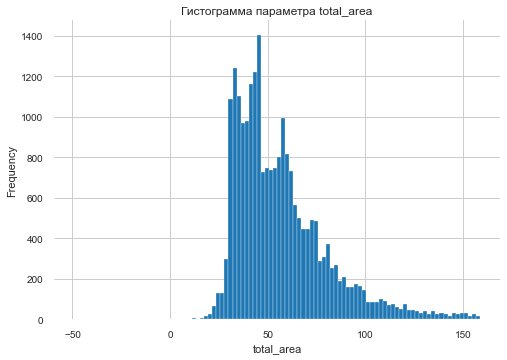

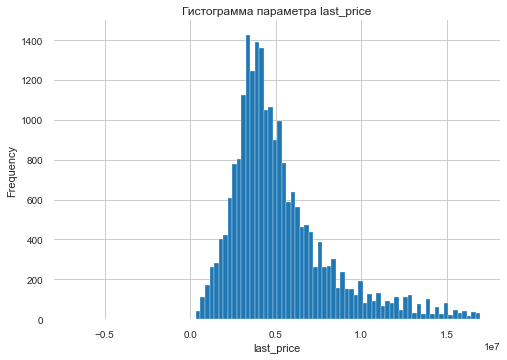

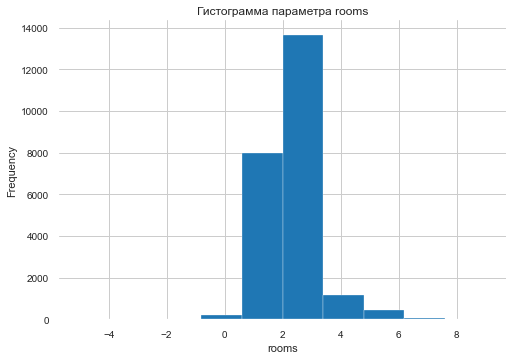

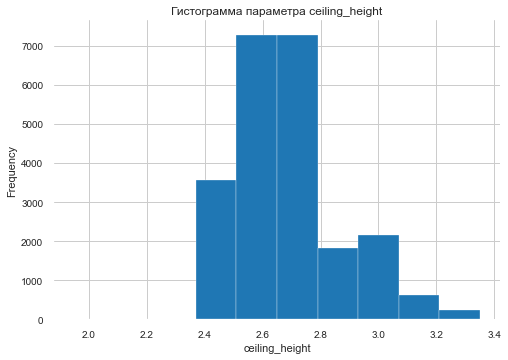

In [105]:
for key, bins in hist_dict.items():
    Q1 = data_apartment[key].quantile(.25)
    Q3 = data_apartment[key].quantile(.75)
    IQR = Q3 - Q1
    plt.grid(True)
    plt.hist(data_apartment[key], bins=bins, range =(Q1 - 3*IQR, Q3 + 3*IQR))
    plt.xlabel(key)
    plt.ylabel('Frequency')
    plt.title('Гистограмма параметра ' + key)
    plt.show()


Диапазон значений для графика  от Q1-3\*IQR до  Q3+3\*IQR


Построим диаграмму размаха, чтобы посмотреть выбросы и построить гистограммы уже без этих выбросов. Сразу зададим масштаб диаграммы, чтобы лучше видеть рассположение квартилей.

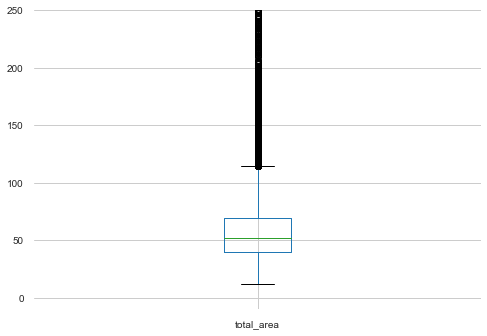

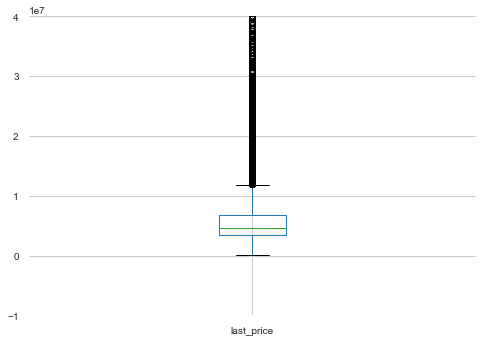

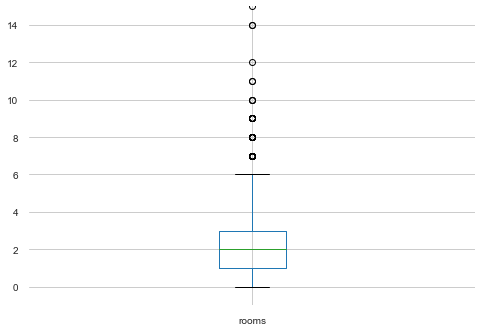

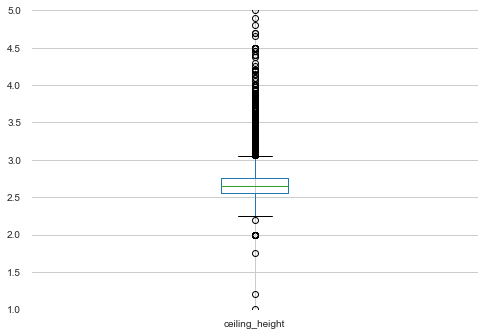

In [106]:
box_dict = {'total_area': [-10,250],
            'last_price':[-0.1e8,0.4e8],
            'rooms':[-1,15],
            'ceiling_height':[1,5]
            }
for name, (ymin,ymax) in box_dict.items():
    plt.ylim(ymin,ymax)
    data_apartment.boxplot(name)
    plt.show()

Столбец **total_area**.Большая часть значений лежит в диапазоне до 75 квадратных метров, что логично. Если посмотреть статистику за 2018 год, то среднее значение площади квартиры в Санкт-Петербурге около 50 квадратных метров.

Нижний квартил лежит на уровне 40 квадратных метров. Нижний ус находится на уровне ниже 25 квадратных метров. Выбросов у нас довольно много. При этом медиана не стремится к верхнему квартилю, значит значения, которые отсекает верхний ус - редкие. 

Посмотрим на нюансы распределения в цифрах.

In [107]:
data_apartment['total_area'].describe()

count    23565.000000
mean        60.322824
std         35.657060
min         12.000000
25%         40.000000
50%         52.000000
75%         69.700000
max        900.000000
Name: total_area, dtype: float64

Заметим, что у нас довольно большое стандартное отклонение. Что как-раз потверждает то, что у нас присутствуют выбросы, и довольно большие(аномальные) значения в этом столбце.

Обратимся к статистике по Санкт-Петербургу за период 4 августа - 4 сентября 2020 год, то можно увидеть такие цифры:

- 1-комнатные квартиры - 38,75 м^2
- 2-комнатные квартиры - 60,56 м^2
- 3-комнатные квартиры - 85,77 м^2


In [108]:
data_apartment.groupby('name_room_flat')['total_area'].mean()

name_room_flat
1-комнатная квартира        37.636569
2-комнатная квартира        55.821274
3-комнатная квартира        77.706740
4-комнатная квартира       107.521459
Многокомнатная квартира    190.121079
Свободная планировка        29.321701
Name: total_area, dtype: float64

Видим, что значения в нашей таблицы отличаются от найденных цифр немного, но так как мы не знаем за какой период эти данные, то можем утверждать, что мы имеем довольно правдоподобное распределение данных этого столбца.

Столбец **last_price**. 

Большинство значений лежит в пределе 7e+06. Если учесть то, что данные столбца last_price зависят от данных столбца total_area, так как обычно чем больше площадь квартиры, тем дороже она стоит. Если опять обратиться к статистике по Санкт-Петербургу за период 4 августа - 4 сентября 2020 год, то можно увидеть такие цифры:

- 1-комнатные квартиры - 4 331 660 т.р.
- 2-комнатные квартиры - 6 841 320 т.р. 
- 3-комнатные квартиры - 9 964 100 т.р.



In [109]:
data_apartment.groupby('name_room_flat')['last_price'].mean()

name_room_flat
1-комнатная квартира       3.833870e+06
2-комнатная квартира       5.587257e+06
3-комнатная квартира       8.174764e+06
4-комнатная квартира       1.341792e+07
Многокомнатная квартира    3.023319e+07
Свободная планировка       3.344493e+06
Name: last_price, dtype: float64

Аналогичная ситуация, как со столбцом total_area

Заметим еще одну особенность в распределении, нижний ус упирается в ноль, что довольно подозрительно. Как и на гистограмме, заметим, что довольно много значений находятся около нуля. 

In [110]:
data_apartment['last_price'].describe()

count    2.356500e+04
mean     6.540058e+06
std      1.091093e+07
min      1.219000e+04
25%      3.400000e+06
50%      4.646000e+06
75%      6.790000e+06
max      7.630000e+08
Name: last_price, dtype: float64

Стандартное отклонение довольно большое, можем сказать, что ситуация с этим столбцом аналогична total_area.

Столбец **rooms**.

Большая часть значений лежит в диапазоне до 6 комнат. Но нижний ус у нас упирается в ноль.Есть выбросы, но их не много.Медиана находится посередине. Но в данном столбце мы можем объяснить рассположение нижнего уса около на нуле, так как у нас есть довольно много квартир без комнат, как я предположила, квартиры со свободной планировкой.

Столбец **ceiling_height**.

Большинство значений находятся в диапозоне 3,2 метров. Довольно много выбросов выше верхнего уса. Но также имеются выбросы ниже нижнего уса. Медиана смешена немного вверх, что говорит о том, что нижние выбросы редкие, верхних же намного больше, хотя, как мы уже выяснили, зачастую потолки выше 3,2 метров не используют. Но в зданиях старой постройки размеры помещения могут быть увеличены, и высота потолков может превысить отметку 4 метра.

### 4.1.Время продажи квартиры

In [111]:
data_apartment['days_exposition'].describe()

count    23565.000000
mean       170.519584
std        206.385810
min          1.000000
25%         45.000000
50%         92.000000
75%        199.000000
max       1580.000000
Name: days_exposition, dtype: float64

array([[<AxesSubplot:title={'center':'days_exposition'}>]], dtype=object)

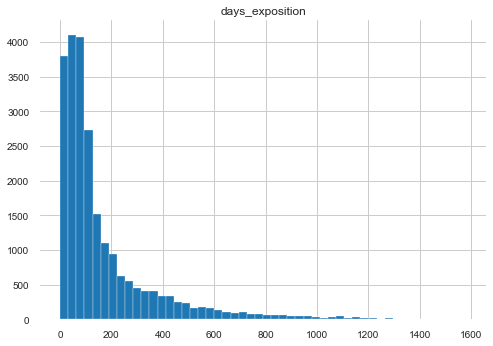

In [112]:
data_apartment.hist('days_exposition', bins=50, range=(0, 1580))

<AxesSubplot:>

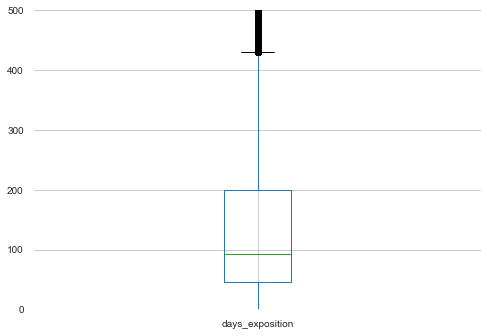

In [113]:
plt.ylim(0,500)
data_apartment.boxplot('days_exposition')


Самые частые значения расположены до 420 дней. Медиана смещина к нижнему усу, значит выбросы хоть и частые, но редкие. 


In [114]:
data_apartment['days_exposition'].describe()

count    23565.000000
mean       170.519584
std        206.385810
min          1.000000
25%         45.000000
50%         92.000000
75%        199.000000
max       1580.000000
Name: days_exposition, dtype: float64

Стандартное отклонение больше, чем среднее. Это может говорить о том, что в распредлении длинный хвост высоких значений влияет на средний показатель, но не на медиану.

Найдем теперь значение среднего значения и медианы.

In [115]:
data_apartment['days_exposition'].mean()

170.51958412900487

In [116]:
data_apartment['days_exposition'].median()

92.0

Из-за выбросов средний показатель сильно смещается вверх. Мы это можем видеть по  значению медианы данного столбца.

Продажа квартиры в среднем занимает от месяца до 6 месяцев.Среднее время продажи - 92 дня. Скорость продажи зависит от готовности документов( какие есть в наличие, а какие придется оформить)

Минимальный срок, за который можно успеть посмотреть выбранную квартиру (с подготовленными заранее документами), подписать договор и внести задаток, а затем сдать документы на регистрацию, составляет один день. Но это довольно редкое явление.

In [117]:
data_apartment.query('days_exposition == 1')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat
1627,19,4000000,49.9,2019-05-01,2,2.5,9,25.0,1,True,...,681,1,80160.32,2,5,2019,Первый,0.501002,0.200401,2-комнатная квартира


В нашей таблице всего одна строка. 

В среднем такая сделка происходит за 95 дней, это чуть больше 3-х месяцев.


Исходя из исследованных данных, сделка, которая была совершена меньше чем за 25 дней прошла довольно быстро. Если время сделки превышает примерно 420 дней, то можно считать, что сделка происходила довольно долго.


### 4.2.Редкие, выбивающиеся значения

На основании построенных диаграмм размаха и гистограмм напишем цикл, который будет удалять выбросы

Выведем describe каждого столбца для сравнения с новой таблицей без выбросов.

In [118]:
for label in ['total_area', 'last_price', 'rooms','ceiling_height', 'days_exposition', 'living_area']:
    print(data_apartment[label].describe())
    print()

count    23565.000000
mean        60.322824
std         35.657060
min         12.000000
25%         40.000000
50%         52.000000
75%         69.700000
max        900.000000
Name: total_area, dtype: float64

count    2.356500e+04
mean     6.540058e+06
std      1.091093e+07
min      1.219000e+04
25%      3.400000e+06
50%      4.646000e+06
75%      6.790000e+06
max      7.630000e+08
Name: last_price, dtype: float64

count    23565.000000
mean         2.070656
std          1.078591
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         19.000000
Name: rooms, dtype: float64

count    23565.000000
mean         2.735737
std          0.996999
min          1.000000
25%          2.550000
50%          2.650000
75%          2.750000
max        100.000000
Name: ceiling_height, dtype: float64

count    23565.000000
mean       170.519584
std        206.385810
min          1.000000
25%         45.000000
50%         92.000000
75%        199.000000
max    

In [119]:
data_clean = data_apartment
save = 0
delete_ratio_mass = []
 # Цикл для удаления выбросов и таблицу с процентом удаленных данных
for label in ['total_area', 'last_price', 'rooms', 'ceiling_height', 'days_exposition', 'living_area']:
    Q1 = data_apartment[label].quantile(.25)
    Q3 = data_apartment[label].quantile(.75)
    IQR = Q3 - Q1
    data_clean = data_clean.loc[~((data_apartment[label] < (Q1-2*IQR)) | (data_apartment[label] > (Q3+2*IQR)))]
    delete_ratio = 1 - len(data_clean[label]) / len(data_apartment[label]) - save
    save = delete_ratio
    delete_ratio_mass.append(delete_ratio)



In [120]:

for label in ['total_area', 'last_price', 'rooms', 'ceiling_height', 'days_exposition', 'living_area']:
    print(data_clean[label].describe())
    print()


count    19794.000000
mean        52.837070
std         18.423292
min         12.000000
25%         39.000000
50%         49.000000
75%         63.000000
max        129.000000
Name: total_area, dtype: float64

count    1.979400e+04
mean     4.867509e+06
std      2.363093e+06
min      1.219000e+04
25%      3.300000e+06
50%      4.390000e+06
75%      5.950000e+06
max      1.355000e+07
Name: last_price, dtype: float64

count    19794.000000
mean         1.912196
std          0.890209
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          6.000000
Name: rooms, dtype: float64

count    19794.000000
mean         2.661048
std          0.148064
min          2.200000
25%          2.550000
50%          2.630000
75%          2.750000
max          3.150000
Name: ceiling_height, dtype: float64

count    19794.000000
mean       121.315500
std        111.434158
min          1.000000
25%         45.000000
50%         89.000000
75%        157.000000
max    

In [121]:
data_clean.shape

(19794, 30)

Посмтроим диаграммы размаха.


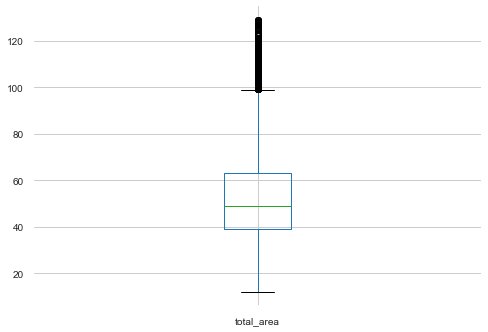

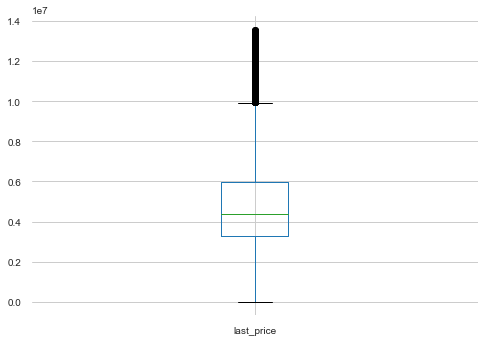

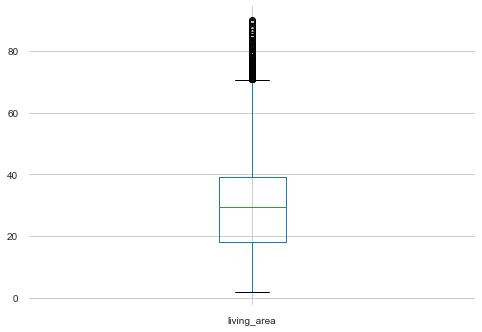

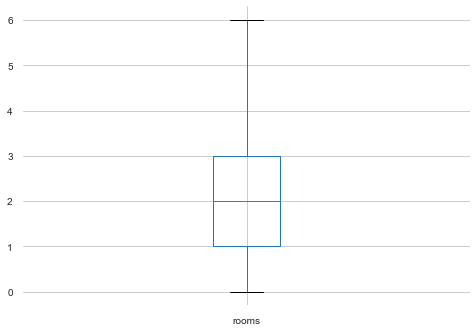

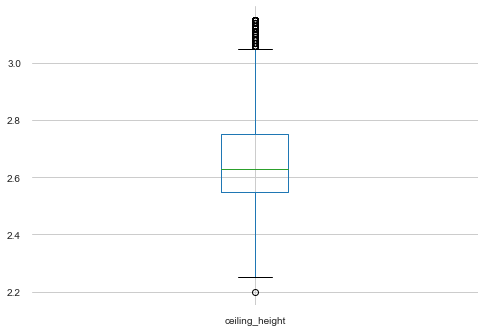

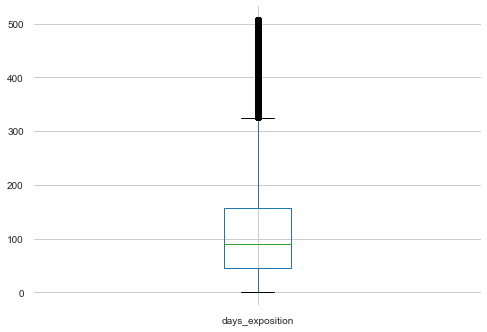

In [122]:
for name in ['total_area', 'last_price', 'living_area', 'rooms', 'ceiling_height', 'days_exposition']:
    data_clean.boxplot(name)
    plt.show()

Видно, что не во всех столбцах были удалены все выбросы, но их осталось не так много. Посмотрим, сколько процентов данных было удаленно в каждой таблице.


In [123]:
delete_ratio_table = pd.DataFrame(index=['total_area', 'last_price', 'rooms', 'ceiling_height', 'days_exposition', 'living_area'], columns=['ratio'], data=delete_ratio_mass)
delete_ratio_table.style.format({'ratio':"{:.2%}"})

,ratio
total_area,3.65%
last_price,3.32%
rooms,3.65%
ceiling_height,6.36%
days_exposition,9.57%
living_area,6.43%



Заметим, что больше всего удаленных данных у нас в столбце days_exposition. 
    В столбцах living_area и ceiling_height было удалено примерно одинаковое количество значений. Хотя, значения ceiling_height можно обработать иначе. Например, если предположить, что все значения выше 10 - ошибка, то можно эти значения привести к среднему значению по этажности. В остальных столбцах было удалено около 5 % значений. 


Теперь общая площадь не превышает значения 114 квадратных метров, жилая площадь 78 квадратных метров. В целом, именно такие цифры встречаются чаще всего на сайтах о продаже квартиры.

Стоимость квартиры не превышает 12 млн. р., цифры правдоподобные для максимального значения общей площади квартиры.

Количество комнат теперь не превышает 6, в первоначальной таблице у нас было максимальное число комнат - 20.

Высота потолков не превышает 3 метров. Как я писала, нет задокументированной точной цифры максимальной высоты потолков, в среднем от 2.7 до 3.6 метров. Крайне редко, когда высота потолков достигает отметки 4 метра и выше.

Обработали количество дней продажи квартиры. Максимальное число в новой таблице - 462 дня, это около года и двух месяцев. Но более длинные сделки мы убрали, так как они являлись выбросами.

### 4.3.Факторы, влияющие на стоимость квартиры

In [124]:
data_clean[['last_price', 'total_area', 'rooms', 'cityCenters_nearest']].corr()

,last_price,total_area,rooms,cityCenters_nearest
last_price,1.000000,0.712875,0.441849,0.124019
total_area,0.712875,1.000000,0.799255,0.000100
rooms,0.441849,0.799255,1.000000,-0.003871
cityCenters_nearest,0.124019,0.000100,-0.003871,1.000000


Корреляция между ценой и общей площадью высокая, довольно логично. Цена всегда возрастает от роста площади квартиры. 

Корреляция цены с кол-вом комнат средняя. Что возможно объяснить. Не всегда от роста количества комнат увеличивается жилая или общая площадь помещения, тоже самое по отношению к цене.

Корреляция цены с расстоянием до города. Сгруппируем по столбцу cityCenters_nearest и посмотрим зависимость цены

In [125]:
data_clean.groupby('cityCenters_nearest')['last_price'].mean().sort_values(ascending=False).head(15)

cityCenters_nearest
7359     13500000.0
4785     13500000.0
6229     13500000.0
4677     13500000.0
2879     13400000.0
10790    13400000.0
5489     13300000.0
6127     13300000.0
7152     13300000.0
3424     13300000.0
12952    13200000.0
16622    13150000.0
1796     13000000.0
5020     13000000.0
27704    13000000.0
Name: last_price, dtype: float64

Видим, что дорогие квартиры не имеют тенденцию быть ближе к центру. Для нас важно расстояние до центра, если это Санкт-Петербург, сделаем срез по этому городу и посмотрим зависимость цены именно в Санкт-Петербурге.

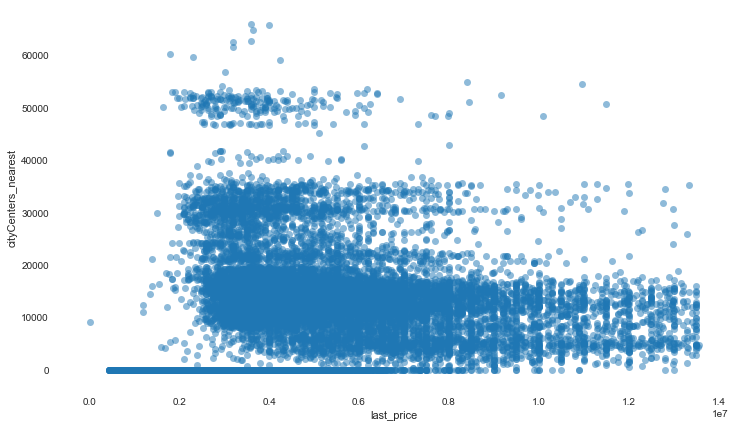

In [126]:
plt.figure(figsize=(12,7))
plt.plot(data_clean['last_price'], data_clean['cityCenters_nearest'], 'o', alpha=0.5)
plt.xlabel('last_price')
plt.ylabel('cityCenters_nearest')
plt.show()


По графику видно, что большая концетрация цен находится в диапазоне от 3 млн.р. до 9-10 млн.р. до 30-35 км от центра города. Так же заметно, что до 15 км от центра города много квартир имееют высокую цену, когда как дальше 15 км в этом высоком диапозоне появляется значений 5.


In [127]:
data_clean.query('locality_name == "Санкт-Петербург"').groupby('cityCenters_nearest')['last_price'].mean().sort_values(ascending=False).head(10)

cityCenters_nearest
6229     13500000.0
4785     13500000.0
4677     13500000.0
7359     13500000.0
2879     13400000.0
10790    13400000.0
3424     13300000.0
6127     13300000.0
5489     13300000.0
7152     13300000.0
Name: last_price, dtype: float64

Видим, что изменений не произошло. Можем сделать вывод, что высокая стоимость квартиры зависит от расстояния до центра. И большинство дорогих квартир находятся в пределах 15 км от центра Санкт-Петербурга.

Теперь посмотрим, как зависит цена от этажа.

In [128]:
data_clean.groupby('name_of_floor')['last_price'].mean()

name_of_floor
Другой       5.081810e+06
Первый       4.058621e+06
Последний    4.448692e+06
Name: last_price, dtype: float64

In [129]:
data_clean['name_of_floor'].value_counts()

Другой       14630
Последний     2671
Первый        2493
Name: name_of_floor, dtype: int64

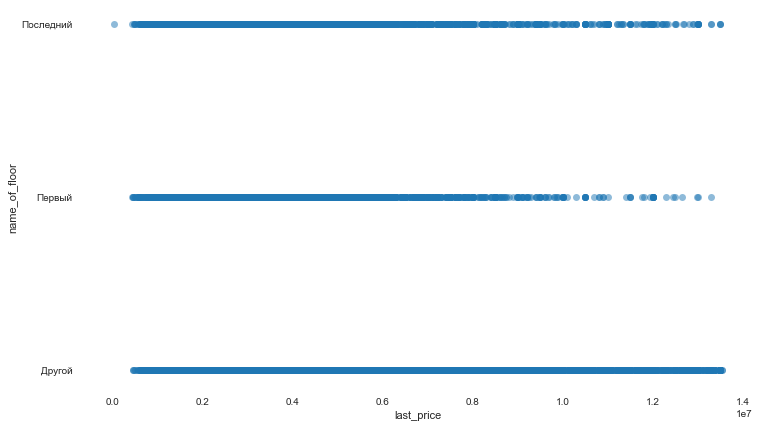

In [130]:
plt.figure(figsize=(12,7))
plt.plot(data_clean['last_price'], data_clean['name_of_floor'], 'o', alpha=0.5)
plt.xlabel('last_price')
plt.ylabel('name_of_floor')
plt.show()

Как на графики, так и в таблице видим, что цены для последних этажей выше, чем цены для первых. Средняя цена других этажей самая высокая, но заметим, что таких значений в нашей таблице больше всего.
Посмотрим на таблицу те же данные, только таблицы с выборсами.

In [131]:
data_apartment.groupby('name_of_floor')['last_price'].mean()

name_of_floor
Другой       6.674349e+06
Первый       4.802604e+06
Последний    7.359138e+06
Name: last_price, dtype: float64

Вот тут более заметно, что цена возрастает с ростом этажа. Самые дорогие квартиры последних этажей, а более дешевые -  первых.


Изучим зависимость от даты размещения. Посмотрим на таблицу корреляции нужных нам значений и на heatmap.


In [132]:
data_clean[['last_price', 'day_of_week', 'month', 'year']].corr()

,last_price,day_of_week,month,year
last_price,1.000000,-0.017065,0.002104,0.024692
day_of_week,-0.017065,1.000000,0.015441,-0.007479
month,0.002104,0.015441,1.000000,-0.299307
year,0.024692,-0.007479,-0.299307,1.000000


<AxesSubplot:>

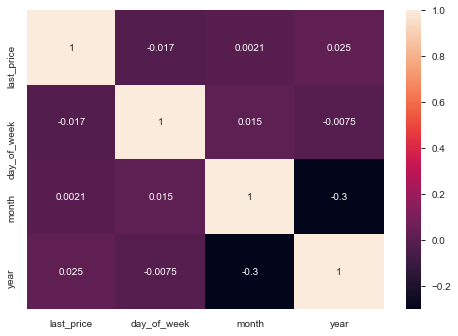

In [133]:
sns.heatmap(data_clean[['last_price', 'day_of_week', 'month', 'year']].corr(), annot=True, fmt='.2g')

Корреляция очень маленькая, посмотрим на срез по этим столбцам.


In [134]:
data_clean.groupby('day_of_week')['last_price'].median().sort_values(ascending=False)

day_of_week
2    4400000
1    4400000
0    4400000
6    4350000
5    4350000
4    4350000
3    4350000
Name: last_price, dtype: int64

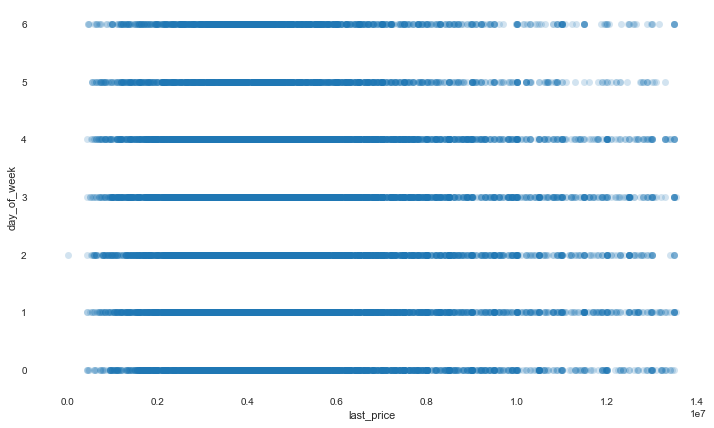

In [135]:
plt.figure(figsize=(12,7))
plt.plot(data_clean['last_price'], data_clean['day_of_week'], 'o', alpha=0.2)
plt.xlabel('last_price')
plt.ylabel('day_of_week')
plt.show()


От дня недели цена квартиры не зависит. Цены отличаются незначительно. Можно заметить, что в субботу, воскрессенье концетрация наибольшой стоимости меньше, чем в остальные дни.


In [136]:
data_clean.groupby('month')['last_price'].median().sort_values(ascending=False)

month
4     4550000
11    4450000
3     4400000
12    4390000
1     4380000
9     4370000
10    4350000
8     4350000
2     4350000
7     4300000
5     4300000
6     4150000
Name: last_price, dtype: int64

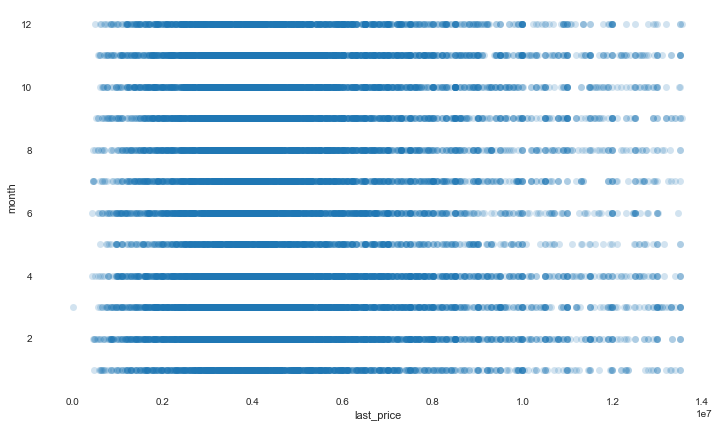

In [137]:
plt.figure(figsize=(12, 7))
plt.plot(data_clean['last_price'],data_clean['month'], 'o', alpha=0.2)
plt.xlabel('last_price')
plt.ylabel('month')
plt.show()


Публикации, выложенные в апреле имеет наивысшую цену. В июне - наименьшую. Но, при этом, разница между max и min средним значением в этих месяцах 390000. В декабре, октябре, сентябре, августе, марте, феврале, январе средняя цена опубликованных квартир одинаковая. Такое распределение мы видим и на графике. В мае, июне и июле цена имеет тенденцию снижаться. Что довольно логично, так как обычно летом людям не до покупки квартиры, падает спрос и ,соответсвенно, падает цена на квартиры.


In [138]:
data_clean.groupby('year')['last_price'].median().sort_values(ascending=False)

year
2014    7500000
2019    4800000
2015    4500000
2018    4350000
2016    4285000
2017    4250000
Name: last_price, dtype: int64

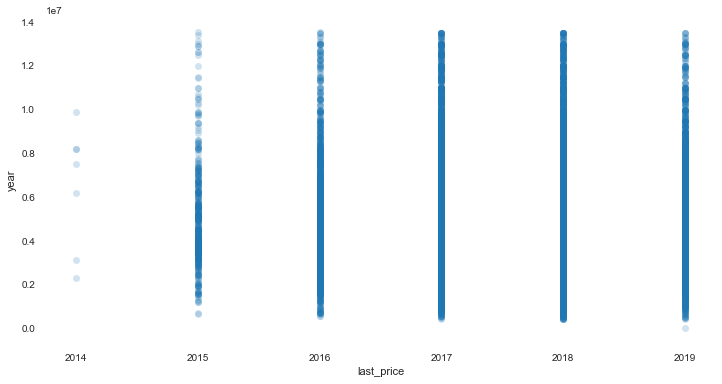

In [139]:
plt.figure(figsize=(12,6))
plt.plot(data_clean['year'],data_clean['last_price'], 'o', alpha=0.2)
plt.xlabel('last_price')
plt.ylabel('year')
plt.show()

В 2014 году было наименьшее количество объявлений. Средняя цена в 2014 году наибольшая, но только из-за того, что выборка маленькая. В 2017 и 2018 больше всего было объявлений, при этом средняя цена в 2017 году наименьшая. В 2015 было тоже немного объявлений, если сравнивать с 2016,2017,2018 и 2019 годом. Основная концетрация в диапазоне от 4 млн.р. до 7 млн.р.


Построим график для зависмости количества комнат и стоимости.


In [140]:
data_clean.groupby('rooms')['last_price'].median().sort_values(ascending=False)

rooms
6    9100000
5    8130000
4    6800000
3    5750000
2    4600000
1    3590000
0    2700000
Name: last_price, dtype: int64

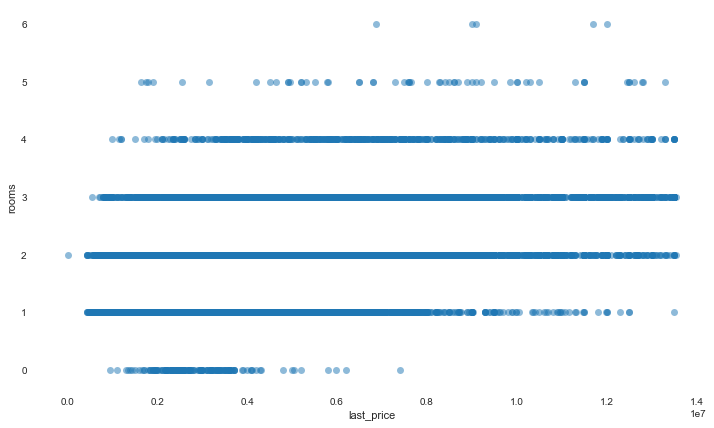

In [141]:
plt.figure(figsize=(12,7))
plt.plot(data_clean['last_price'], data_clean['rooms'], 'o', alpha=0.5)
plt.xlabel('last_price')
plt.ylabel('rooms')
plt.show()

Видно, что трехкомнатные комнаты чаще всего появляются на объявлениях. Также можно сказать, что наивысшую цену имеют 3-комнатные квартиры, по крайней мере в диапазоне высоких цен довольно высокая концетрация относительно других объявляений. Двухкомнатные квартиры также имеют высокую концетрацию в диапазоне высоких цен. Это одни из самых популярных покумаемых и продаваемых квартир, что довольно логично. Квартиры, у которых нет комнат, я их называю квартирами со свободной планировкой,  входят в диапазон цен от 2 млн. р. до 4-5млн.р. Из таблицы видно, что зависимость цены от числа комнат присутствует, чем больше комнат, тем выше цена.


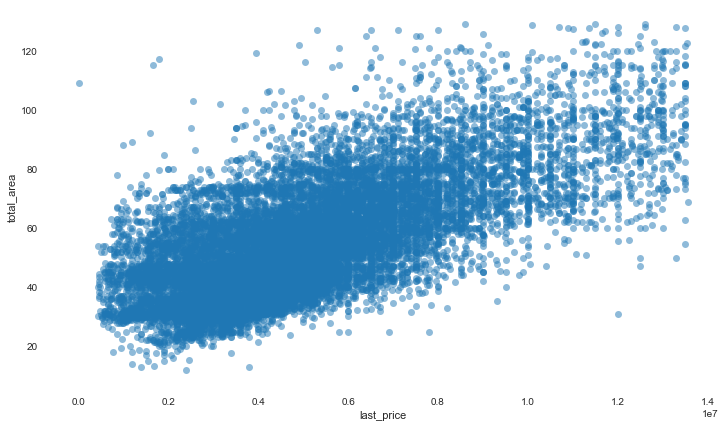

In [142]:
plt.figure(figsize=(12,7))
plt.plot(data_clean['last_price'], data_clean['total_area'], 'o', alpha=0.5)
plt.xlabel('last_price')
plt.ylabel('total_area')
plt.show()

Из этого графика прослеживается зависимость роста цены от роста площади. Можем увидеть, что чем больше площадь квартиры, тем больше за нее будет цена. 


Посмотрим на 10 населенных пунктов с наибольшим числом объявлений.

In [143]:
data_clean['locality_name'].value_counts().sort_values(ascending=False).head(10)

Санкт-Петербург    12552
Мурино               551
Кудрово              434
Шушары               416
Всеволожск           360
Колпино              316
Парголово            312
Пушкин               307
Гатчина              275
Выборг               205
Name: locality_name, dtype: int64

In [144]:
data_clean.pivot_table(index='locality_name', values = 'cost_per_square', aggfunc=['count','mean'])


,count,mean
,cost_per_square,cost_per_square
locality_name,,
Агалатово,3,71078.753333
Александровская,1,63559.320000
Алексеевка,1,22222.220000
Аннино,13,64122.274615
Аро,3,51412.420000
...,...,...
Юкки,4,74310.190000
Ялгино,1,17659.090000


In [145]:
top_10 = data_clean.groupby('locality_name').agg({'locality_name':'count', 'cost_per_square':'mean'})

In [146]:
top_10.columns = ['amount', 'avr_cost_per_square']

In [147]:
top_10_locality = top_10.sort_values(by='amount', ascending=False).head(10)

In [148]:
top_10_locality.reset_index()

,locality_name,amount,avr_cost_per_square
0,Санкт-Петербург,12552,106413.236152
1,Мурино,551,86241.054537
2,Кудрово,434,95494.148664
3,Шушары,416,78457.674303
4,Всеволожск,360,67062.810667
5,Колпино,316,75336.608797
6,Парголово,312,90053.545385
7,Пушкин,307,100478.046124
8,Гатчина,275,68772.540400
9,Выборг,205,57876.608878


<AxesSubplot:xlabel='locality_name'>

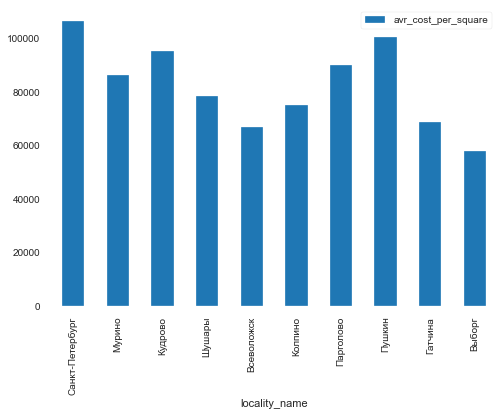

In [149]:
top_10_locality.plot(kind = 'bar',y='avr_cost_per_square')

Самое большое количество объявлений в Санкт-Петербурге, аналогично со средней ценой за квадратный метр. В Выборге наименьшее количество объявлений и наименьшая цена за квадратный метр из этих 10 населенных пунктов.

В остальных населенных пунктах нет закономерной зависимости между количеством объявлением и ценой.

Но цены находятся в диапазоне между max и min значением в этих 10-ти населенных пунктах.

В городе Пушкин средняя цена за квадратный метр довольно высокая, почти как в Санкт-Петербурге. В Кудрово и Парголово цена чуть ниже, чем в Пушкино, но тоже довольно высокая относительно остальных городов с большим количеством объявлений.

In [150]:
data_clean[['locality_name', 'last_price']].sort_values(by='last_price',ascending=False)

,locality_name,last_price
13620,Санкт-Петербург,13550000
3509,Санкт-Петербург,13544976
6534,Санкт-Петербург,13500000
14164,Санкт-Петербург,13500000
21844,Санкт-Петербург,13500000
...,...,...
17577,Ям-Тесово,450000
16185,Старополье,440000
14825,Свирь,430000
17359,Сланцы,430000


В Санкт-Петербурге самая высокая стоимость жилья, но, при этом, в Санкт-Петербурге самая низка стоимость жилья, при этом цена очень маленькая, проверим, что это за столбец.

In [151]:
data_clean.query('last_price == 12190')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat
8750,7,12190,109.0,2019-03-20,2,2.75,25,32.0,25,True,...,520,8,111.83,2,3,2019,Последний,0.293578,0.37156,2-комнатная квартира


2-х комнатная квартира, площадью 109 квадратных метром за 12190 в Санкт-Петербурге, довольно странно. Скорее всего это мошенники, так как цена слишком маленькая для такой большой площади.

В Свирь, Сланцы, Старополье и Ям-Тесово находятся квартиры с самой низкой стоимостью жилья. Цена тоже небольшая, посмотрим на общу и жилую площадь этих квартир.

In [152]:
data_clean.query('last_price == 430000')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat
14825,5,430000,54.0,2018-06-26,2,2.8,3,31.73,3,True,...,0,44,7962.96,1,6,2018,Последний,0.587593,0.184630,2-комнатная квартира
17359,7,430000,30.4,2019-04-22,1,2.7,2,16.00,1,True,...,0,81,14144.74,0,4,2019,Первый,0.526316,0.197368,1-комнатная квартира


In [153]:
data_clean.query('last_price == 440000')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat
16185,18,440000,40.0,2018-07-10,1,2.55,5,17.9,1,True,...,0,45,11000.0,1,7,2018,Первый,0.4475,0.2385,1-комнатная квартира


In [154]:
data_clean.query('last_price == 450000')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat
5670,7,450000,42.0,2017-07-31,2,2.80,1,23.00,1,True,...,0,233,10714.29,0,7,2017,Первый,0.547619,0.138095,2-комнатная квартира
9535,7,450000,43.4,2018-08-31,2,2.55,5,30.30,3,True,...,0,96,10368.66,4,8,2018,Другой,0.698157,0.126728,2-комнатная квартира
16130,14,450000,38.5,2018-07-11,2,2.65,2,31.73,1,True,...,0,45,11688.31,2,7,2018,Первый,0.824156,0.258961,2-комнатная квартира
17577,0,450000,36.5,2018-02-01,1,2.55,5,17.30,4,True,...,0,120,12328.77,3,2,2018,Другой,0.473973,0.232877,1-комнатная квартира


Так как район находится в 168 км от Санкт-Петербурга, то такие низкие цены имеют место быть.

### 4.4.Предложения квартир

In [155]:
data_clean.query('locality_name == "Санкт-Петербург"')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,ponds_nearest,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.00,8,True,...,755,114,120370.37,3,3,2019,Другой,0.472222,0.231481,3-комнатная квартира
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.00,13,True,...,48,121,100000.00,1,6,2018,Другой,0.320000,0.410000,2-комнатная квартира
7,5,7915000,71.6,2019-04-18,2,2.75,24,31.73,22,True,...,520,91,110544.69,3,4,2019,Другой,0.443156,0.263966,2-комнатная квартира
9,18,5400000,61.0,2017-02-26,3,2.50,9,43.60,7,True,...,520,289,88524.59,6,2,2017,Другой,0.714754,0.106557,3-комнатная квартира
10,5,5050000,39.6,2017-11-16,1,2.67,12,20.30,3,True,...,553,137,127525.25,3,11,2017,Другой,0.512626,0.214646,1-комнатная квартира
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23552,8,3300000,31.0,2017-04-29,1,2.55,9,18.00,6,True,...,317,193,106451.61,5,4,2017,Другой,0.580645,0.209677,1-комнатная квартира
23553,6,3200000,39.0,2017-12-16,1,2.55,9,20.00,6,True,...,520,38,82051.28,5,12,2017,Другой,0.512821,0.282051,1-комнатная квартира
23554,19,9200000,101.0,2019-04-01,3,3.05,15,63.00,12,True,...,520,23,91089.11,0,4,2019,Другой,0.623762,0.148515,3-комнатная квартира
23555,13,3550000,35.3,2018-02-28,1,2.86,15,16.30,4,True,...,652,29,100566.57,2,2,2018,Другой,0.461756,0.257790,1-комнатная квартира


Создам столбец с расстоянием до центра в км, чтобы было удобнее с этими данными работать в дальнейшем.

In [156]:
data_clean['distance_cityCenter'] = data_clean['cityCenters_nearest'] / 1000
data_clean['distance_cityCenter'] = np.around(data_clean['distance_cityCenter'])

Округлила значения, приведем им к типу int, так как нам все равно не нужна десятичная часть.

In [157]:
data_clean['distance_cityCenter'] = data_clean['distance_cityCenter'].astype(int)

In [158]:
data_clean.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat,distance_cityCenter
0,20,13000000,108.0,2019-03-07,3,2.70,16,51.0,8,True,...,114,120370.37,3,3,2019,Другой,0.472222,0.231481,3-комнатная квартира,16
1,7,3350000,40.4,2018-12-04,1,2.75,11,18.6,1,True,...,81,82920.79,1,12,2018,Первый,0.460396,0.272277,1-комнатная квартира,19
4,2,10000000,100.0,2018-06-19,2,3.03,14,32.0,13,True,...,121,100000.00,1,6,2018,Другой,0.320000,0.410000,2-комнатная квартира,8
5,10,2890000,30.4,2018-09-10,1,2.65,12,14.4,5,True,...,55,95065.79,0,9,2018,Другой,0.473684,0.299342,1-комнатная квартира,0
6,6,3700000,37.3,2017-11-02,1,2.66,26,10.6,6,True,...,155,99195.71,3,11,2017,Другой,0.284182,0.386059,1-комнатная квартира,19


In [159]:
price_km = data_clean.groupby('distance_cityCenter').agg({'last_price':'mean'})
price_km = price_km.reset_index()


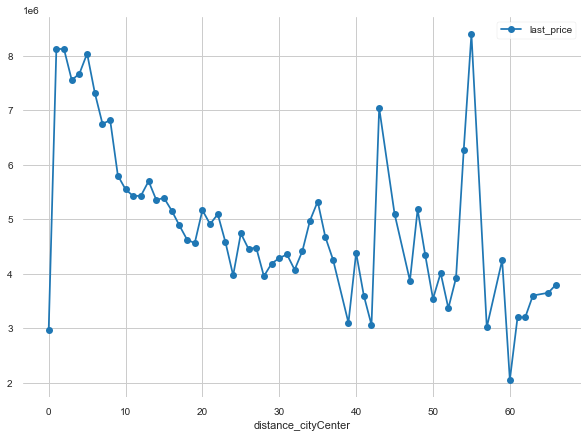

In [160]:
price_km.plot(x='distance_cityCenter', y='last_price', style='o-',grid=True,figsize=(10,7) )
plt.show()

Заметим,что с увеличением дистанции, уменьшается цена квартиры, с определенными пиками, но тенденция заметна. До 8 км изменения в цене есть, но довольно небольшие,  после происходит довольно резкий скачок в цене вниз. Думаю, что  до 8 км - центральная зона.

### 4.5.Сегмент квартир в центре

Возьмем срез квартир в центре, то есть расстояние до центра от квартиры не должно превышать 8 км.

In [161]:
data_center = data_clean.query('distance_cityCenter <= 8')

In [162]:
data_center.head()

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,...,days_exposition,cost_per_square,day_of_week,month,year,name_of_floor,ratio_living_total,ratio_kitchen_total,name_room_flat,distance_cityCenter
4,2,10000000,100.00,2018-06-19,2,3.03,14,32.00,13,True,...,121,100000.00,1,6,2018,Другой,0.320000,0.410000,2-комнатная квартира,8
5,10,2890000,30.40,2018-09-10,1,2.65,12,14.40,5,True,...,55,95065.79,0,9,2018,Другой,0.473684,0.299342,1-комнатная квартира,0
8,20,2900000,33.16,2018-05-23,1,2.70,27,15.43,26,True,...,189,87454.76,2,5,2018,Другой,0.465320,0.265682,1-комнатная квартира,0
12,10,3890000,54.00,2016-06-30,2,2.55,5,30.00,5,True,...,90,72037.04,3,6,2016,Последний,0.555556,0.166667,2-комнатная квартира,0
22,20,5000000,58.00,2017-04-24,2,2.75,25,30.00,15,True,...,60,86206.90,0,4,2017,Другой,0.517241,0.189655,2-комнатная квартира,0


In [163]:
hist_dict = {'total_area': (100, 125),
             'last_price' : (90, 1.25e+07),
             'rooms' : (15, 10),
             'ceiling_height' : (90, 3.5)
            }

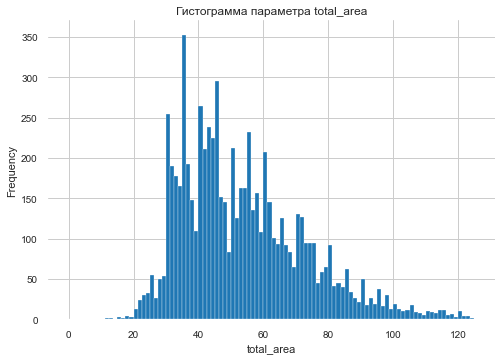

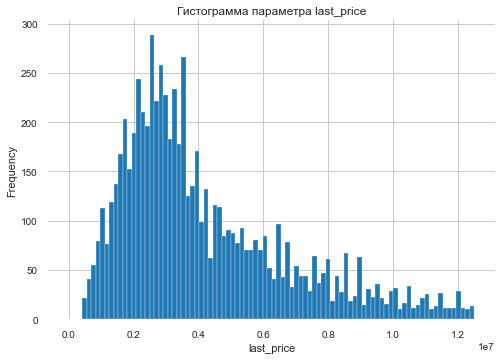

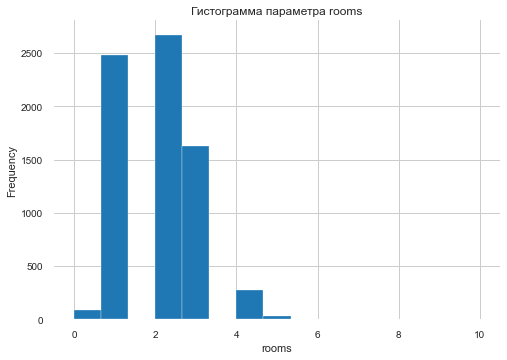

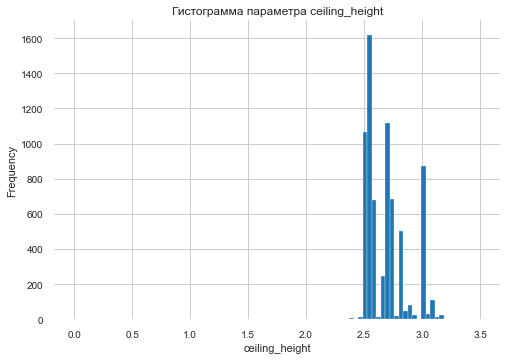

In [164]:
for key, (bins,range_in) in hist_dict.items():
    plt.grid(True)
    plt.hist(data_center[key], bins=bins, range =(0, range_in))
    plt.xlabel(key)
    plt.ylabel('Frequency')
    plt.title('Гистограмма параметра ' + key)
    plt.show()

Так как мы работаем с уже обработанной таблицей, где мы убрали все выбросы, аномальных значений тут мы не увидим.

In [165]:
for key, (bins,range_in) in hist_dict.items():
    print(data_center[key].mean())

53.79317599554441
4316396.088415483
1.947089947089947
2.6867321080478974


In [166]:
data_center['total_area'].max()

129.0

Чаще всего в центре встречаются квартиры площадью в диапазоне от 30 до, примерно, 60 квадратных метров. Среднее значение площади в центре - 52 кв.м. Максимальное значение площади квартиры в центре 114 кв.м.

Наиболее часто встречаются в центре цены на квартиры в диапазоне от 2 млн.р. до 4 млн.р. Максимальная цена квартиры в центральном районе - 1,2 млрд.р.

Наиболее часто встречающиеся квартиры - 2-х комнатные. Потом 1-комнатные, 3-х комнатные. Меньше всего квартир со свободной планировкой, 4-х,5-ти комнатных.

Высота потолков находится в диапозоне от 2.5  до 3-х метров

Теперь посмотрим, какие факторы влияют на стоимость квартиры.

In [167]:
data_center[['last_price', 'rooms', 'cityCenters_nearest', 'day_of_week', 'month', 'year']].corr()

,last_price,rooms,cityCenters_nearest,day_of_week,month,year
last_price,1.000000,0.400369,0.654439,-0.017094,0.009163,-0.054996
rooms,0.400369,1.000000,0.144948,-0.007600,-0.002745,-0.038308
cityCenters_nearest,0.654439,0.144948,1.000000,0.001055,0.001077,-0.063047
day_of_week,-0.017094,-0.007600,0.001055,1.000000,0.040044,-0.000612
month,0.009163,-0.002745,0.001077,0.040044,1.000000,-0.282021
year,-0.054996,-0.038308,-0.063047,-0.000612,-0.282021,1.000000


Самый большой коэффициент корреляции между ценой и удаленностью от центра, что логично. Как мы уже видели из графика, чем дальше находится квратира от центра, тем меньше ее цена.

Коээфициент корреляции цены от количества комнат маленький, цены от даты размещения тоже. Посмотрим на срез по дате размещения, когда и где у нас максимальные и минимальные значения.

In [168]:
for name in ['day_of_week', 'month', 'year']:
    print(data_center.groupby(name)['last_price'].median().sort_values(ascending=False))
    print()

day_of_week
4    3600000
2    3525000
3    3500000
0    3495000
1    3350000
6    3200000
5    3200000
Name: last_price, dtype: int64

month
11    3600000
10    3600000
5     3600000
9     3590000
7     3539500
8     3500000
4     3500000
1     3370000
2     3350000
12    3340000
3     3300000
6     3225000
Name: last_price, dtype: int64

year
2015    3792500
2016    3530000
2019    3500000
2017    3500000
2018    3350000
2014    3150000
Name: last_price, dtype: int64



Максимальное среднее значение цены было у объявлений, выложенных в пятницу и в среду. Минимальное среднее значение цены у объявлений было в субботу.

В октяюре, мае средняя цена объявления была одной из высоких. В июне значительно ниже.

В 2015 году средняя цена объявления была самой высокой. В 2014 году значительно ниже. 

Сравним полученные выводы с выводами по всему городу.

<AxesSubplot:ylabel='Frequency'>

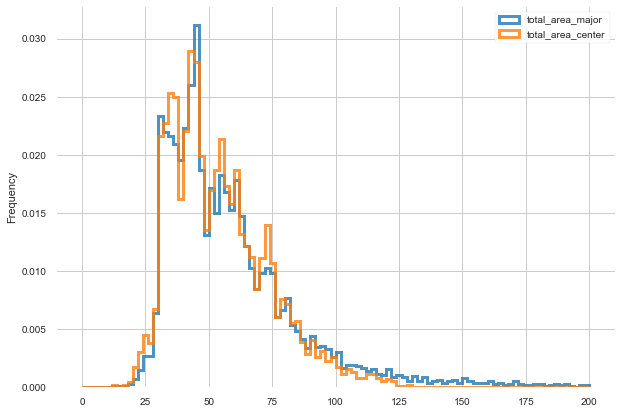

In [169]:
ax = data_apartment.plot(kind='hist', y='total_area', histtype='step', range=(0,200),bins=100, linewidth=3, alpha=0.8, label='total_area_major', density=True)
data_center.plot(kind='hist', y='total_area', histtype='step',range=(0,200),bins = 100, linewidth=3, alpha=0.8,ax=ax,label='total_area_center', grid=True, legend=True, figsize=(10,7), density=True)

Видим отличие в данных в частоте в диапозоне от 27 кв.м. до 130-140 кв.м. примерно. Квартир с площадью больше 100 кв.м. можно встретить чаще за границей центральной района. 

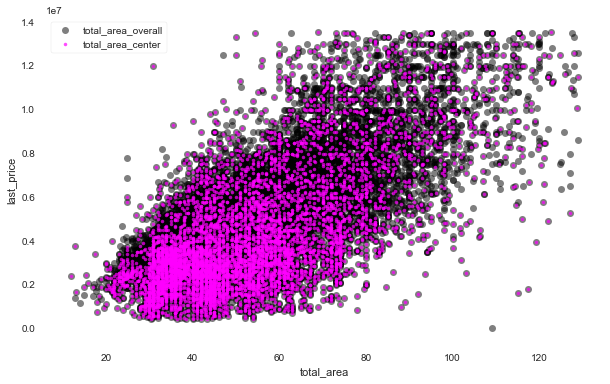

In [170]:
plt.figure(figsize=(10,6))
plt.plot(data_clean['total_area'], data_clean['last_price'],'o',alpha=0.5, label='total_area_overall', color='black')
plt.plot(data_center['total_area'], data_center['last_price'],'.',alpha=0.7, label='total_area_center', color='magenta')
plt.xlabel('total_area')
plt.ylabel('last_price')
plt.legend()
plt.show()


По графику зависимости можно увидеть, что объявлений в центре меньше, более того квартир с более высокой ценой тоже меньше. Диапазон площадей квартир, которые чаще всего продаются, сократился до 90 квадратных метров.


<AxesSubplot:ylabel='Frequency'>

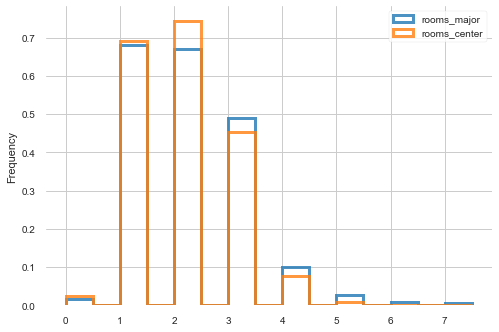

In [171]:
ax1 = data_apartment.plot(kind='hist', y='rooms', histtype='step', range=(0,7.5), bins=15,linewidth=3, alpha=0.8, label='rooms_major', density=True)
data_center.plot(kind='hist', y='rooms', histtype='step', range=(0,7.5), bins=15, linewidth=3, alpha=0.8, label='rooms_center', ax=ax1, grid=True, legend=True, density=True)

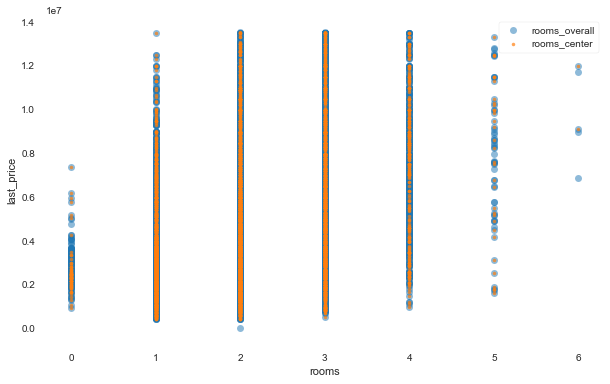

In [172]:
plt.figure(figsize=(10,6))
plt.plot(data_clean['rooms'], data_clean['last_price'],'o',alpha=0.5, label='rooms_overall')
plt.plot(data_center['rooms'], data_center['last_price'],'.',alpha=0.7, label='rooms_center')
plt.xlabel('rooms')
plt.ylabel('last_price')
plt.legend()
plt.show()

В центре реже продают квартиры с 5-ю и больше комнатами, а также квартиры свободной планировки.


Частота объявлений о продаже квартиры со свободной планировкой примерно одинаковое количество и в центре и за его границей. Видим из гистограммы, что 1, 2 -х комнатные квартиры встречаются чаще и в центре, и за его границей, но частота объявлений за центральном районом выше почти в 4 раза. Объявлений о продаже  3, 4 -х комнатных квартир в центре также меньше. Как было сказанно ранее, объявлений о продаже 6-ти комнатных квартир и квартир с большим количеством комнат в центре не встречается на нашем графике, но скорее всего из-за того, что эти данные мы обрезали при обработке выбросов.

<AxesSubplot:ylabel='Frequency'>

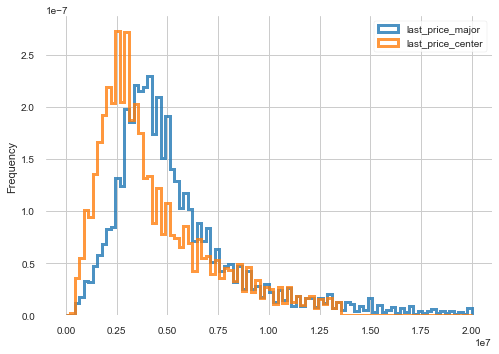

In [173]:
ax2 = data_apartment.plot(kind='hist', y='last_price', histtype='step', range=(0,2e+07), bins=90,linewidth=3, alpha=0.8, label='last_price_major', density=True)
data_center.plot(kind='hist', y='last_price', histtype='step', range=(0,2e+07), bins=90,linewidth=3, alpha=0.8, label='last_price_center', ax=ax2,grid=True,legend=True, density=True)

Интересно, что распределение цены объявлений в центре смещается в меньшую сторону, и чаще всего у нас встречаются значения в диапазоне от 2 до 4 млн.р. За центральным районом наиболее часто встречающиеся значения имеют диапазон в почти в 2 раза шире.

<AxesSubplot:ylabel='Frequency'>

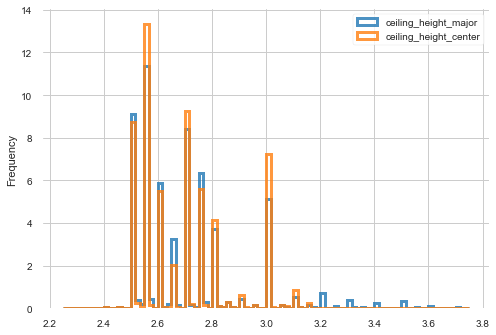

In [174]:
ax2 = data_apartment.plot(kind='hist', y='ceiling_height', histtype='step', range=(2.25,3.75), bins=90,linewidth=3, alpha=0.8, label='ceiling_height_major', density=True)
data_center.plot(kind='hist', y='ceiling_height', histtype='step', range=(2.25,3.75), bins=90,linewidth=3, alpha=0.8, label='ceiling_height_center', ax=ax2,grid=True,legend=True, density=True)

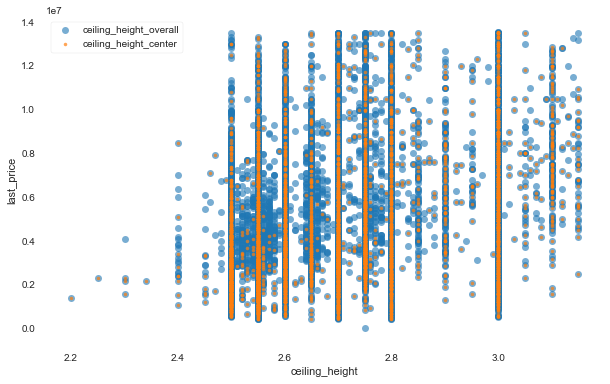

In [175]:
plt.figure(figsize=(10,6))
plt.plot(data_clean['ceiling_height'], data_clean['last_price'],'o',alpha=0.6, label='ceiling_height_overall')
plt.plot(data_center['ceiling_height'], data_center['last_price'],'.',alpha=0.7,label='ceiling_height_center')
plt.xlabel('ceiling_height')
plt.ylabel('last_price')
plt.legend()
plt.show()

Видим, что 2.5 метров, 2.7, 3 метра - самая часто используемая высота потолков в центре города.


### Вывод

Во время проведенной работы были изучены данные, определенны пропущенные значения. Замена и удаление пропущенных значений было объянено. Пропуски были обнаружены в 13 столбцах. В таких столбац, как ceiling_height, airports_nearest, cityCenters_nearest, parks_around3000, parks_nearest, ponds_nearest, ponds_around3000 большинство пропущенных значений были заменены средним значением в населенном пунтке. Остальные оставшиеся пропущенные значения - нулями(ceiling_height - средним по столбцу)

В столбцах floors_total, locality_name очень мало пропущенных значений( < 1%), было решено удалить строки, где в этих столбцах есть пропуски.

Пропуски в столбцах kitchen_area, living_area заменены на среднее в срезе количества комнат в квартире.

В balcony прпоуски были заменены на нули, так как они означали, что в квартире балкона не имеется. В столбце days_exposition пропуски также были заполнены нулями, что означает, что нет информации о снятии публикации.

Столбец locality_name был обработан, убраны названия поселений для дальнейшей удобной работы с ним.

Было выявлено, что большинство объявлений, которые висят еще на сайте, а значит квартиры не проданы - это апартаменты.

Были посчитаны и добавлены в таблицу следующие параметры:цена квадратного метра, день недели, месяц и год публикации объявления,этаж квартиры в виде( первый, последний, другой),соотношение жилой и общей площади, а также отношение площади кухни к общей.

Далее были изучены такие параметры: площадь, цена, число комнат, высота потолков и построены гистограммы для каждого параметра.

Было изучено время продажи квартиры. Выяснили, что сделка в среднем происходит за чуть больше, чем 3 месяца.Также, если сделка была совершена меньше чем за 25 дней, то будем считать, что она прошла довольно быстро. Если время сделки превышает примерно 450 дней, то можно считать, что сделка происходила довольно долго.

Далее, были удалены редкие выбивающиеся значения на основе построенных гистограмм и даиграмм рассеяния.

Основной фактор, влияющий на стоимость квартиры - площадь квартиры. Количество комнат на стоимость не влияет так сильно, поэтому коэффициент корреляции между двумя данными средний. Удаленность от города влияет, был построен граффик, выявлена центральная зона - до 8 км.

Выявлены 10 населенных пунктов с наибольшим количеством объявлений, посчитана средняя цена квадратного метра в этих городах и поселениях. 

Самая высокая цена квартир - в Санкт-Петербурге.
Самая низкая цена - в Свирь, Сланцы, Старополье и Ям-Тесово.

Изучен сегмент квартир в центре. Проведено сравнение с общими данными в виде гистограмм. Довольно значительное отличие было найдено в цене. Распределение цены объявлений в центре смещается в меньшую сторону, и чаще всего у нас встречаются значения в диапазоне от 2 до 4 млн.р. За центральным районом наиболее часто встречающиеся значения имеют диапазон в почти в 2 раза шире.